# Linear regression with R: `brms`, `rstanarm`, `bayesplot`, and `loo`

This workshop's goal—which is facilitated by this notebook—is to give attendees the confidence to conduct Bayesian regression analyses with `R` for their research projects.

[`brms`](https://paul-buerkner.github.io/brms/index.html) provides an interface to fit Bayesian generalized (non-)linear multivariate multilevel models using `Stan`.  The formula syntax is very similar to that of the package `lme4` to provide a familiar and simple interface for performing regression analyses.

[`rstanarm`](https://mc-stan.org/rstanarm/index.html) emulates other `R` model-fitting functions but uses `Stan` for the back-end estimation.  The primary target audience is people who would be open to Bayesian inference if using Bayesian software were easier but would use frequentist software otherwise.

[`bayesplot`](https://mc-stan.org/bayesplot/index.html) provides an extensive library of plotting functions for use after fitting Bayesian models (typically with MCMC).

[`loo`](https://mc-stan.org/loo/index.html) allows users to compute efficient approximate leave-one-out cross-validation for fitted Bayesian models, as well as model weights that can be used to average predictive distributions.

To motivate this workshop, we'll work with examples from [Regression and Other Stories](https://avehtari.github.io/ROS-Examples/examples.html) and go through the various steps of conducting regression analyses in a [Bayesian workflow](https://arxiv.org/abs/2011.01808). Hopefully, you will come away feeling confident you can use R to conduct regression analyses for your research projects.

# Table of Contents

## Linear regression with [`rstanarm`](https://mc-stan.org/rstanarm/index.html) or [`brms`](https://paul-buerkner.github.io/brms/index.html)

- ### An intercept

- ### A binary predictor

- ### A continuous predictor

- ### Two predictors (no interaction)

- ### Model comparison

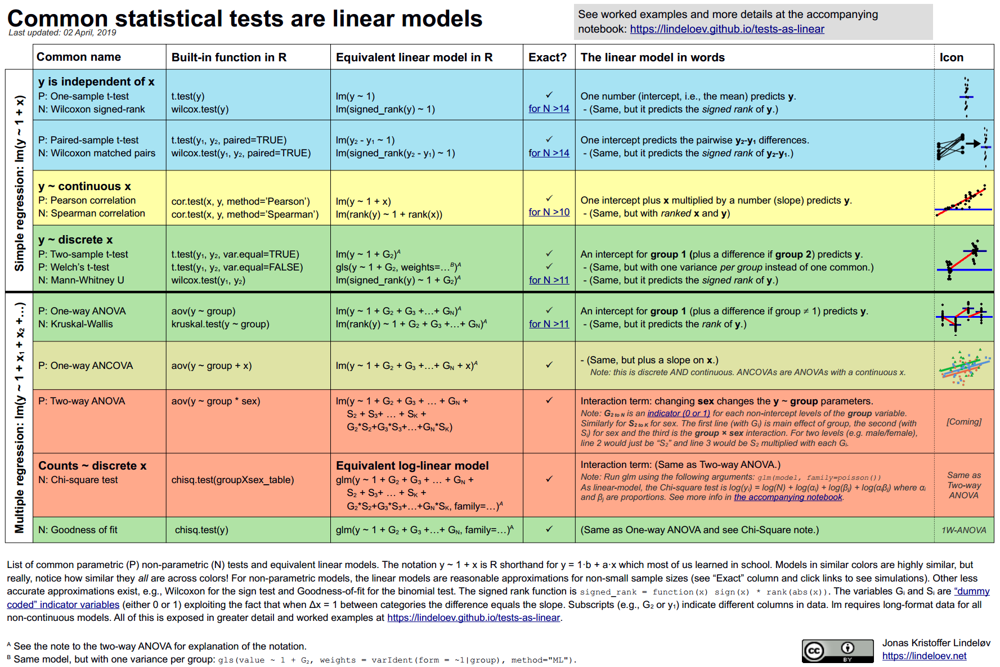

---

## Load packages

In [ ]:
if (!require("pacman")) install.packages("pacman")
pacman::p_load("tidyverse",
               "brms",
               "bayesplot",
               "loo",
               "marginaleffects",
               "MASS",
               "modelr",
               "patchwork",
               "rstanarm",
               "tidybayes")

## Visualization in Bayesian workflow
- Plot data
- Plot model
- Plot prior parameter distributions
- Plot prior predictive distributions
- Plot MCMC diagnostics
- Plot posterior parameter distributions
- Plot posterior predictive distributions
- Plot model comparisons

## Load Data into DataFrame

The data used in these examples is available in the following [GitHub repository](https://github.com/avehtari/ROS-Examples/tree/master). For this example, we're working with the `kidiq` dataset from [Regression and Other Stories](https://avehtari.github.io/ROS-Examples/examples.html).

In [ ]:
kidiq <- read_csv('https://raw.githubusercontent.com/cbrownley/2025ODSCWest/main/data/kidiq.csv')
glimpse(kidiq)

## Explore Data

In [ ]:
# sapply(kidiq, function(x) sum(is.na(x)))

# colSums(is.na(kidiq))

kidiq %>%
  summarise_all(~sum(is.na(.)))

kid_score,mom_hs,mom_iq,mom_age
<int>,<int>,<int>,<int>
0,0,0,0


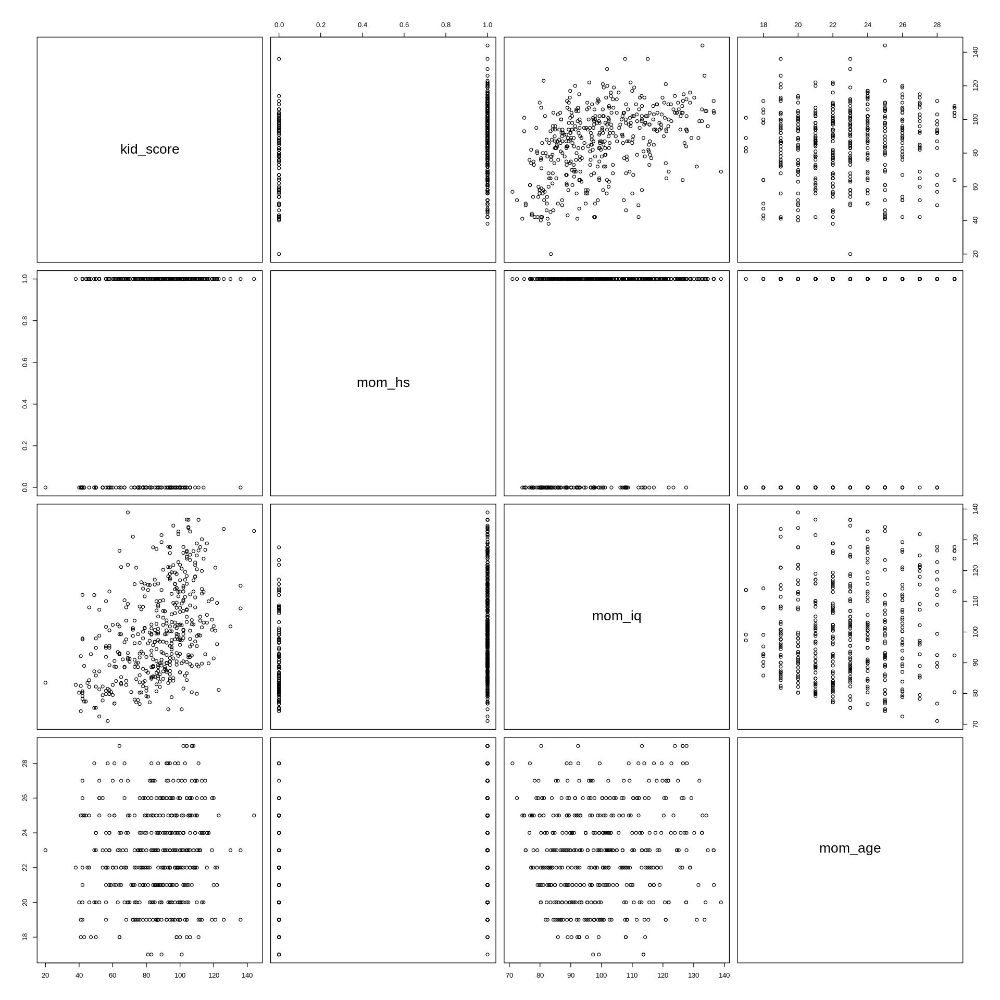

In [ ]:
options(repr.plot.width = 16, repr.plot.height = 16)
pairs(kidiq)

In [ ]:
summary(kidiq)

   kid_score         mom_hs           mom_iq          mom_age     
 Min.   : 20.0   Min.   :0.0000   Min.   : 71.04   Min.   :17.00  
 1st Qu.: 74.0   1st Qu.:1.0000   1st Qu.: 88.66   1st Qu.:21.00  
 Median : 90.0   Median :1.0000   Median : 97.92   Median :23.00  
 Mean   : 86.8   Mean   :0.7857   Mean   :100.00   Mean   :22.79  
 3rd Qu.:102.0   3rd Qu.:1.0000   3rd Qu.:110.27   3rd Qu.:25.00  
 Max.   :144.0   Max.   :1.0000   Max.   :138.89   Max.   :29.00  

---

# 1. An intercept (a column of 1s)

## Estimating a mean is the same as regressing on a constant term

We start by modeling the children's test scores with an intercept (a column of 1s), which summarizes the children's overall mean test score.  As shown by the coefficient for the Intercept, the children's overall mean test score is about 87.

## Plot data

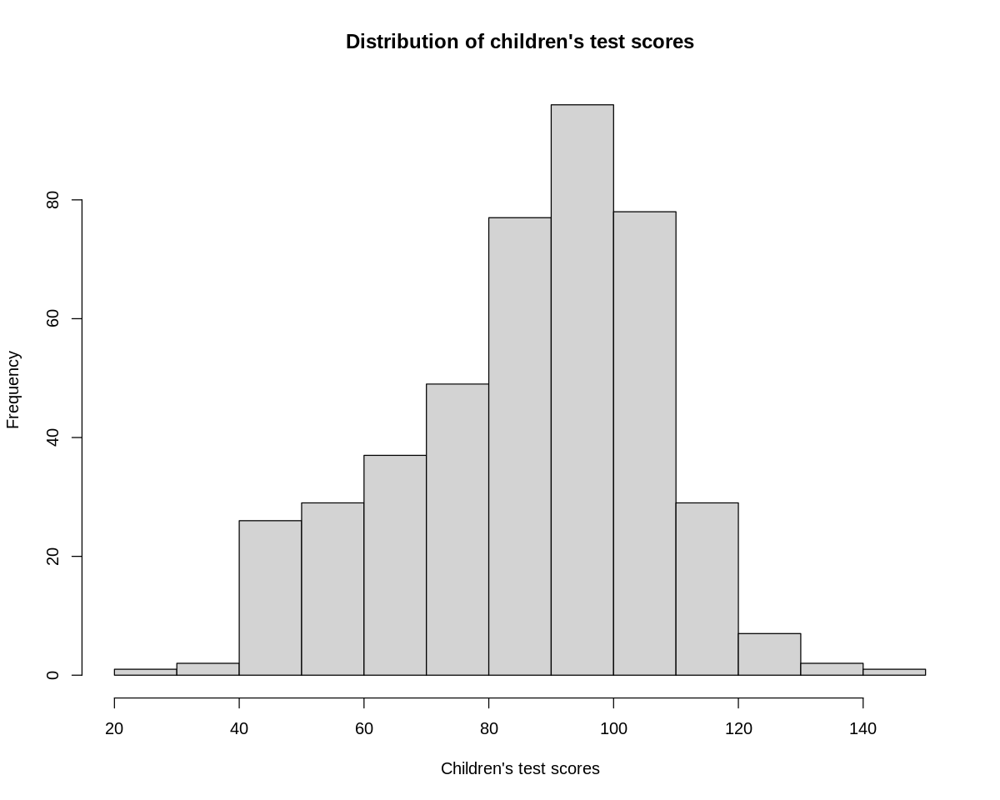

In [ ]:
options(repr.plot.width = 10, repr.plot.height = 8)
hist(kidiq$kid_score,
     main="Distribution of children's test scores",
     xlab="Children's test scores")

In [ ]:
# Mean of children's test scores
round(mean(kidiq$kid_score),1)

[1] 86.8

In [ ]:
# Standard deviation of children's test scores
round(sd(kidiq$kid_score),1)

[1] 20.4

## Plot model

The printouts show that, in the model, `kid_score` is distributed as a normal, [Gaussian distribution](https://distribution-explorer.github.io/continuous/normal.html), with a mean (`Intercept`) that is also normally-distributed and a standard deviation (`sigma`) that is distributed has an [Exponential distribution](https://distribution-explorer.github.io/continuous/exponential.html).

In [ ]:
m1 <- stan_glm(kid_score ~ 1, data = kidiq,
               family = gaussian(link = "identity"),
               seed = 241348,
               refresh=0)

m1

stan_glm
 family:       gaussian [identity]
 formula:      kid_score ~ 1
 observations: 434
 predictors:   1
------
            Median MAD_SD
(Intercept) 86.8    1.0  

Auxiliary parameter(s):
      Median MAD_SD
sigma 20.4    0.7  

------
* For help interpreting the printed output see ?print.stanreg
* For info on the priors used see ?prior_summary.stanreg

In [ ]:
prior_summary(m1)

Priors for model 'm1' 
------
Intercept (after predictors centered)
  Specified prior:
    ~ normal(location = 87, scale = 2.5)
  Adjusted prior:
    ~ normal(location = 87, scale = 51)

Auxiliary (sigma)
  Specified prior:
    ~ exponential(rate = 1)
  Adjusted prior:
    ~ exponential(rate = 0.049)
------
See help('prior_summary.stanreg') for more details

## Plot prior parameter distributions

[Prior Choice Recommendations](https://github.com/stan-dev/stan/wiki/Prior-Choice-Recommendations)

1. Flat prior (not usually recommended).

2. Super-vague but proper prior: normal(0, 1e6) (not usually recommended).

3. Weakly informative prior, very weak: normal(0, 10).

4. Generic weakly informative prior: normal(0, 1).

5. Specific informative prior: normal(0.4, 0.2) or whatever. Sometimes this can be expressed as a scaling followed by a generic prior: theta = 0.4 + 0.2*z ; z ~ normal(0, 1).

The above numbers assume that parameters are roughly on unit scale, as is done in education (where 0 is average test score in some standard population (e.g., all students at a certain grade level) and 1 is sd of test scores in that population) or medicine (where 0 is zero dose and 1 is a standard dose such as 10mcg/day of cyanocobalamin, 1,000 IU/day cholecalciferol, etc.; these examples come from Sander Greenland).

In addition, statements such as "informative" or "weakly informative" depend crucially on what questions are being asked (a point that is related to the idea that [the prior can often only be understood in the context of the likelihood](http://www.stat.columbia.edu/~gelman/research/published/entropy-19-00555-v2.pdf)).

[Default (Weakly Informative) Prior Distributions](https://mc-stan.org/rstanarm/articles/priors.html)

With very few exceptions, the default priors in [`rstanarm`](https://mc-stan.org/rstanarm/articles/priors.html) —the priors used if they aren't specified— are not flat priors. Rather, the defaults are intended to be weakly informative. That is, they are designed to provide moderate regularization and help stabilize computation. For many (if not most) applications the defaults will perform well, but this is not guaranteed (there are no default priors that make sense for every possible model specification).

[Prior predictive checks](https://www.pymc.io/projects/docs/en/stable/learn/core_notebooks/posterior_predictive.html) are also a crucial part of the Bayesian modeling workflow. Basically, they have two main benefits:

* They allow you to check whether you are indeed incorporating scientific knowledge into your model - in short, they help you check how credible your assumptions before seeing the data are.

* They can help sampling considerably, especially for generalized linear models, where the outcome space and the parameter space diverge because of the link function.

[`prior_summary`](https://mc-stan.org/rstanarm/reference/prior_summary.stanreg.html): Summarize the priors used for an [`rstanarm`](https://mc-stan.org/rstanarm/articles/priors.html) model.

In [ ]:
prior_summary(m1)

Priors for model 'm1' 
------
Intercept (after predictors centered)
  Specified prior:
    ~ normal(location = 87, scale = 2.5)
  Adjusted prior:
    ~ normal(location = 87, scale = 51)

Auxiliary (sigma)
  Specified prior:
    ~ exponential(rate = 1)
  Adjusted prior:
    ~ exponential(rate = 0.049)
------
See help('prior_summary.stanreg') for more details

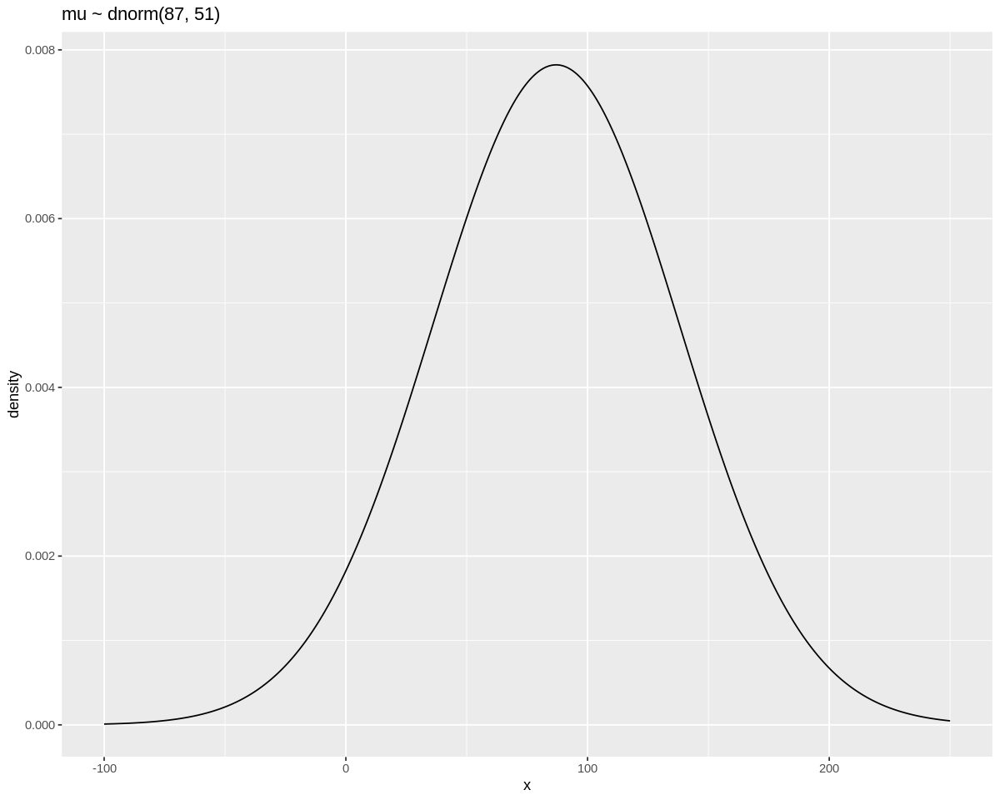

In [ ]:
options(repr.plot.width = 10, repr.plot.height = 8)
p1 <-
  tibble(x = seq(from = -100, to = 250, by = .1)) %>%

  ggplot(aes(x = x, y = dnorm(x, mean = 87, sd = 51))) +
  geom_line() +
  scale_x_continuous(breaks = seq(from = -100, to = 250, by = 100)) +
  labs(title = "mu ~ dnorm(87, 51)",
       y = "density")

p1

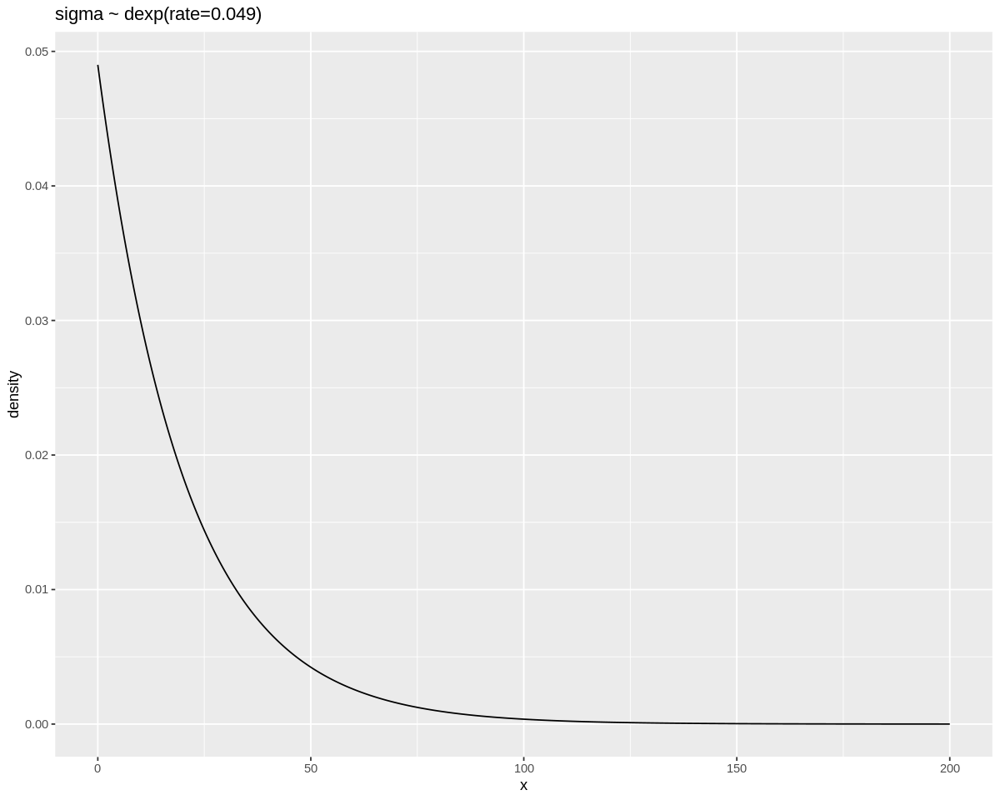

In [ ]:
options(repr.plot.width = 10, repr.plot.height = 8)
p2 <-
  tibble(x = seq(from = 0, to = 200, by = .1)) %>%

  ggplot(aes(x = x, y = dexp(x, rate = 0.049))) +
  geom_line() +
  scale_x_continuous(breaks = seq(from = 0, to = 200, by = 50)) +
  labs(title = "sigma ~ dexp(rate=0.049)",
       y = "density")

p2

## Fit model

[Fit](https://mc-stan.org/rstanarm/reference/stan_glm.html) the model using Stan.

`formula`, `data`, `subset`: Same as [glm](https://rdrr.io/r/stats/glm.html), but *we strongly advise against omitting the `data` argument*. Unless data is specified (and is a data frame) many post-estimation functions (including `update`, `loo`, `kfold`) are not guaranteed to work properly.

`iter`: The number of samples to draw from the posterior distribution. By default, all `rstanarm` modeling functions will run **four** randomly initialized Markov chains, each for `2000` iterations (including a warmup period of `1000` iterations that is discarded).

`chains`: The number of chains to sample. Running independent chains is important for some convergence statistics and can also reveal multiple modes in the posterior. By default, all `rstanarm` modeling functions will run **four** randomly initialized Markov chains, each for `2000` iterations (including a warmup period of `1000` iterations that is discarded).

`algorithm`: A string (possibly abbreviated) indicating the estimation approach to use. Can be `"sampling"` for MCMC (the **default**), `"optimizing"` for optimization, `"meanfield"` for variational inference with independent normal distributions, or `"fullrank"` for variational inference with a multivariate normal distribution. See [rstanarm-package](https://mc-stan.org/rstanarm/reference/rstanarm-package.html) for more details on the estimation algorithms.

[Markov Chain Monte Carlo (MCMC)](https://bookdown.org/content/4857/markov-chain-monte-carlo.html): This chapter introduces one commonplace example of [Fortuna](https://en.wikipedia.org/wiki/Rota_Fortunae#/media/File:Lydgate-siege-troy-wheel-fortune-detail.jpg) and [Minerva](https://en.wikipedia.org/wiki/Minerva#/media/File:Minerva-Vedder-Highsmith-detail-1.jpeg)'s cooperation: the estimation of posterior probability distributions using a stochastic process known as **Markov chain Monte Carlo (MCMC)** ([McElreath, 2020a, p. 263](https://bookdown.org/content/4857/markov-chain-monte-carlo.html#ref-mcelreathStatisticalRethinkingBayesian2020), **emphasis** in the original).

In [ ]:
m1 <- stan_glm(kid_score ~ 1, data = kidiq,
               family = gaussian(link = "identity"),
               seed = 241348,
               refresh=0)

m1

stan_glm
 family:       gaussian [identity]
 formula:      kid_score ~ 1
 observations: 434
 predictors:   1
------
            Median MAD_SD
(Intercept) 86.8    1.0  

Auxiliary parameter(s):
      Median MAD_SD
sigma 20.4    0.7  

------
* For help interpreting the printed output see ?print.stanreg
* For info on the priors used see ?prior_summary.stanreg

In [ ]:
summary(m1)


Model Info:
 function:     stan_glm
 family:       gaussian [identity]
 formula:      kid_score ~ 1
 algorithm:    sampling
 sample:       4000 (posterior sample size)
 priors:       see help('prior_summary')
 observations: 434
 predictors:   1

Estimates:
              mean   sd   10%   50%   90%
(Intercept) 86.8    1.0 85.6  86.8  88.1 
sigma       20.4    0.7 19.6  20.4  21.4 

Fit Diagnostics:
           mean   sd   10%   50%   90%
mean_PPD 86.9    1.4 85.1  86.9  88.6 

The mean_ppd is the sample average posterior predictive distribution of the outcome variable (for details see help('summary.stanreg')).

MCMC diagnostics
              mcse Rhat n_eff
(Intercept)   0.0  1.0  2807 
sigma         0.0  1.0  2600 
mean_PPD      0.0  1.0  3541 
log-posterior 0.0  1.0  1981 

For each parameter, mcse is Monte Carlo standard error, n_eff is a crude measure of effective sample size, and Rhat is the potential scale reduction factor on split chains (at convergence Rhat=1).

[Fitted model objects](https://mc-stan.org/rstanarm/reference/stanreg-objects.html)

The `rstanarm` model-fitting functions return an object of class `'stanreg'`, which is a list containing at a minimum the components listed below. Each stanreg object will also have additional classes (e.g. `'aov'`, `'betareg'`, `'glm'`, `'polr'`, etc.) and several additional components depending on the model and estimation algorithm.

[`summary`](https://mc-stan.org/rstanarm/reference/summary.stanreg.html): Summary method for stanreg objects. Summaries of parameter estimates and MCMC convergence diagnostics (Monte Carlo error, effective sample size, Rhat).

[Reference](https://mc-stan.org/rstanarm/reference/index.html)

* About `rstanarm`

* Fitting models

* Methods

* Additional documentation

## Plot MCMC diagnostics

[`mcmc_neff`](https://mc-stan.org/bayesplot/reference/MCMC-diagnostics.html): Ratios of effective sample size to total sample size as either points or a histogram. Values are colored using different shades (lighter is better). The chosen thresholds are somewhat arbitrary, but can be useful guidelines in practice.

[`mcmc_rhat`](https://mc-stan.org/bayesplot/reference/MCMC-diagnostics.html): [`R-hat`](https://mc-stan.org/bayesplot/articles/visual-mcmc-diagnostics.html#rhat-potential-scale-reduction-statistic) values as either points or a histogram. Values are colored using different shades (lighter is better). The chosen thresholds are somewhat arbitrary, but can be useful guidelines in practice.

[`mcmc_dens_overlay`](https://mc-stan.org/bayesplot/reference/MCMC-diagnostics.html): Various [types](https://mc-stan.org/bayesplot/reference/MCMC-distributions.html) of histograms and kernel density plots of MCMC draws.

[`mcmc_trace`](https://python.arviz.org/en/stable/examples/plot_trace.html): Trace and rank [plots](https://mc-stan.org/bayesplot/reference/MCMC-traces.html) of MCMC draws.

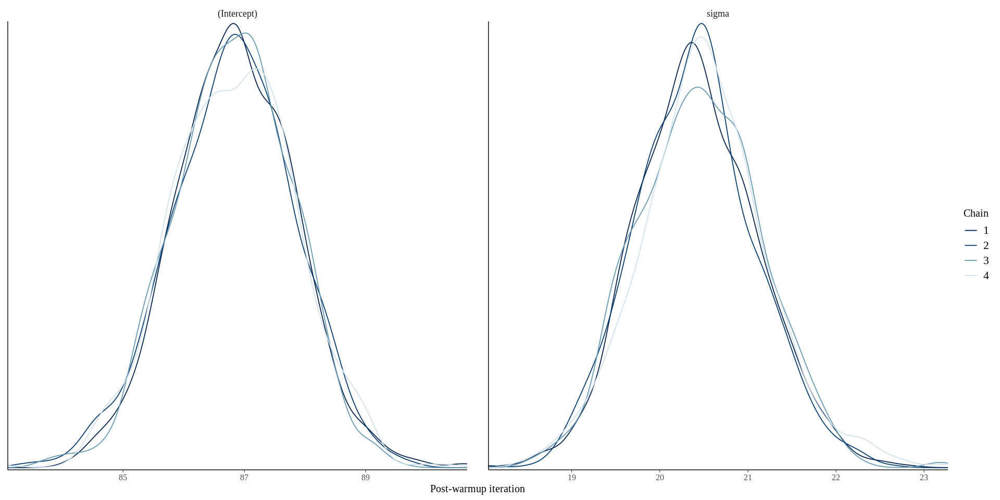

In [ ]:
options(repr.plot.width = 16, repr.plot.height = 8)
mcmc_dens_overlay(m1) +
  xlab("Post-warmup iteration")

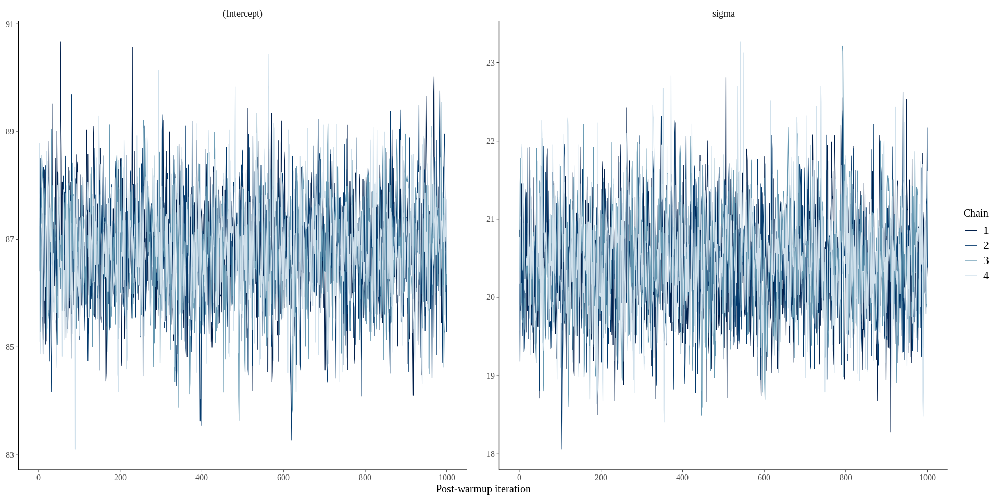

In [ ]:
options(repr.plot.width = 16, repr.plot.height = 8)
mcmc_trace(m1) +
  xlab("Post-warmup iteration")

## Plot posterior distributions

The [posterior probability](https://en.wikipedia.org/wiki/Posterior_probability) is a type of [conditional probability](https://en.wikipedia.org/wiki/Conditional_probability) that results from [updating](https://en.wikipedia.org/wiki/Bayesian_updating) the [prior probability](https://en.wikipedia.org/wiki/Prior_probability) with information summarized by the [likelihood](https://en.wikipedia.org/wiki/Likelihood_function) via an application of [Bayes' rule](https://en.wikipedia.org/wiki/Bayes%27_rule).

Chapter 7 [The Posterior - The Goal of Bayesian
Inference](https://sites.math.rutgers.edu/~zeilberg/EM20/Lambert.pdf) in "A Student's Guide to Bayesian Statistics" by Ben Lambert

[`as.array` `as.matrix` `as.data.frame`](https://mc-stan.org/rstanarm/reference/as.matrix.stanreg.html): Extract the posterior sample. For models fit using MCMC (`algorithm="sampling"`), the posterior sample -the post-warmup draws from the posterior distribution- can be extracted from a fitted model object as a matrix, data frame, or array. The `as.matrix` and `as.data.frame` methods merge all chains together, whereas the `as.array` method keeps the chains separate.

[`pp_check`](https://mc-stan.org/bayesplot/reference/pp_check.html): Posterior (or prior) predictive checks (S3 generic and default method).

In [ ]:
m1_post <- as.array(m1)
dim(m1_post)

[1] 1000    4    2

In [ ]:
dimnames(m1_post)

$iterations
NULL

$chains
[1] "chain:1" "chain:2" "chain:3" "chain:4"

$parameters
[1] "(Intercept)" "sigma"

In [ ]:
m1_post <- as.matrix(m1)
dim(m1_post)

[1] 4000    2

In [ ]:
dimnames(m1_post)

$iterations
NULL

$parameters
[1] "(Intercept)" "sigma"

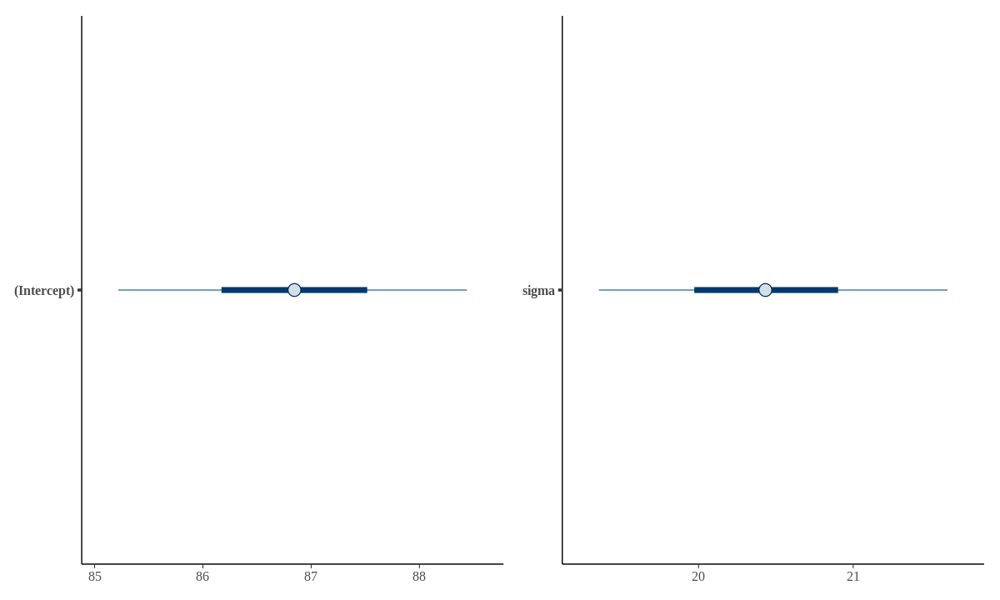

In [ ]:
options(repr.plot.width = 10, repr.plot.height = 6)
g1 <- mcmc_intervals(m1_post, pars = c("(Intercept)"))
g2 <- mcmc_intervals(m1_post, pars = c("sigma"))
g1 + g2

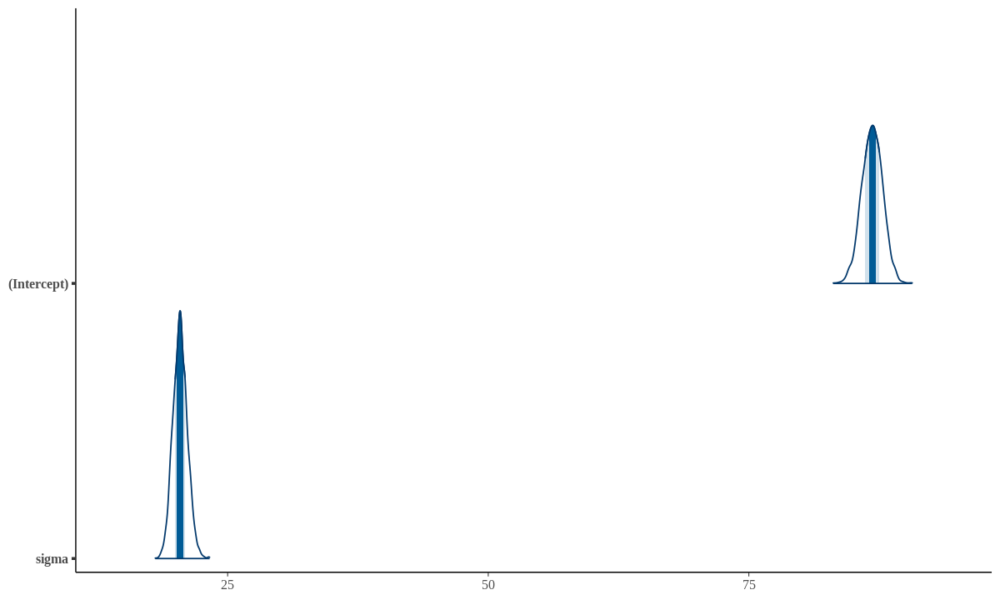

In [ ]:
options(repr.plot.width = 10, repr.plot.height = 6)
mcmc_areas(m1_post)

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


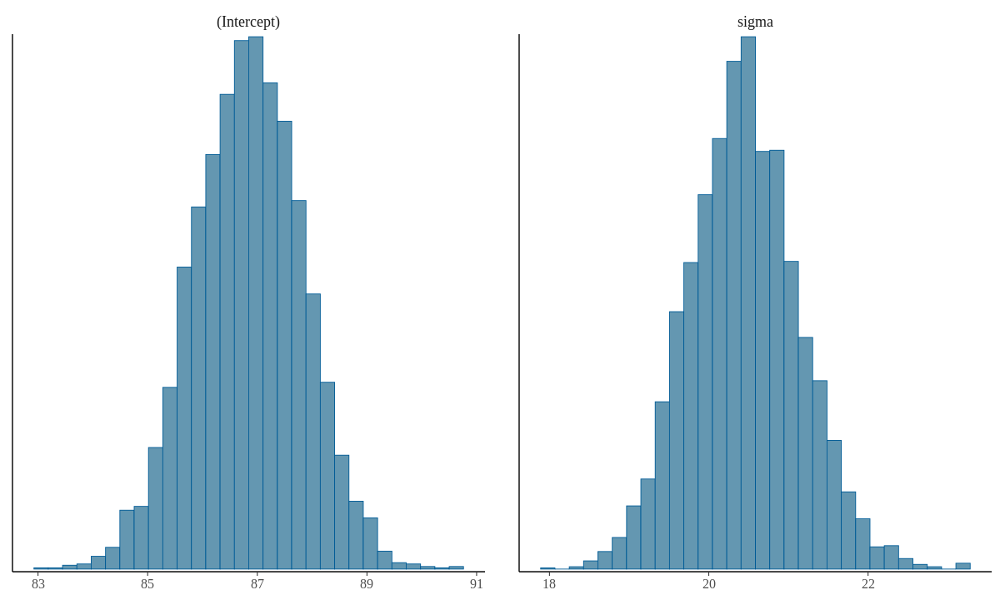

In [ ]:
options(repr.plot.width = 10, repr.plot.height = 6)
mcmc_hist(m1_post)

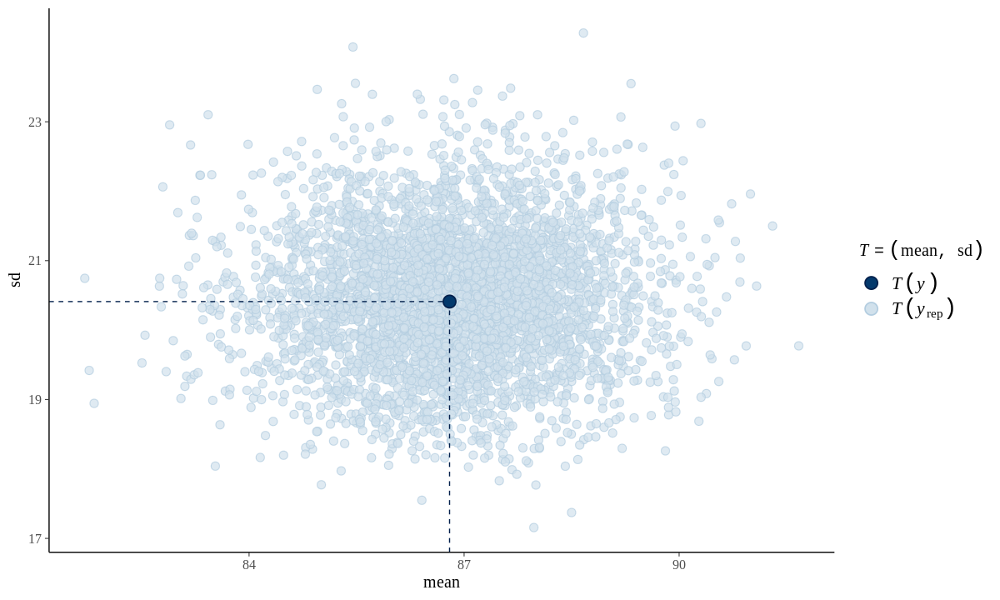

In [ ]:
pp_check(m1, plotfun = "stat_2d", stat = c("mean", "sd"))

In [ ]:
print(m1)

stan_glm
 family:       gaussian [identity]
 formula:      kid_score ~ 1
 observations: 434
 predictors:   1
------
            Median MAD_SD
(Intercept) 86.8    1.0  

Auxiliary parameter(s):
      Median MAD_SD
sigma 20.4    0.7  

------
* For help interpreting the printed output see ?print.stanreg
* For info on the priors used see ?prior_summary.stanreg


## Plot posterior predictive distributions

[Posterior predictive checks (PPCs)](https://www.pymc.io/projects/docs/en/stable/learn/core_notebooks/posterior_predictive.html) are a great way to validate a model. The idea is to generate data from the model using parameters from draws from the posterior.

Elaborating slightly, one can say that PPCs analyze the degree to which data generated from the model deviate from data generated from the true distribution. So, often you will want to know if, for example, your posterior distribution is approximating your underlying distribution. The visualization aspect of this model evaluation method is also great for a 'sense check' or explaining your model to others and getting criticism.

[Graphical posterior predictive checks (PPCs)](https://mc-stan.org/bayesplot/articles/graphical-ppcs.html)

The `bayesplot` package provides various plotting functions for graphical posterior predictive checking, that is, creating graphical displays comparing observed data to simulated data from the posterior predictive distribution ([Gabry et al, 2019](https://mc-stan.org/bayesplot/articles/graphical-ppcs.html#gabry2019)).

The idea behind [posterior predictive checking](https://mc-stan.org/docs/stan-users-guide/posterior-prediction.html) is simple: if a model is a good fit then we should be able to use it to generate data that looks a lot like the data we observed. To generate the data used for posterior predictive checks (PPCs) we simulate from the posterior predictive distribution. This is the distribution of the outcome variable implied by a model after using the observed data 𝑦 (a vector of 𝑁 outcome values) to update our beliefs about unknown model parameters 𝜃.

[`posterior_predict`](https://mc-stan.org/rstanarm/reference/posterior_predict.stanreg.html): The posterior predictive distribution is the distribution of the outcome implied by the model after using the observed data to update our beliefs about the unknown parameters in the model. Simulating data from the posterior predictive distribution using the observed predictors is useful for checking the fit of the model. Drawing from the posterior predictive distribution at interesting values of the predictors also lets us visualize how a manipulation of a predictor affects (a function of) the outcome(s). With new observations of predictor variables we can use the posterior predictive distribution to generate predicted outcomes.

[`ppc_dens_overlay`](https://mc-stan.org/bayesplot/reference/PPD-distributions.html): Plot posterior or prior predictive distributions. Each of these functions makes the same plot as the corresponding `ppc_` function but without plotting any observed data `y`.

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


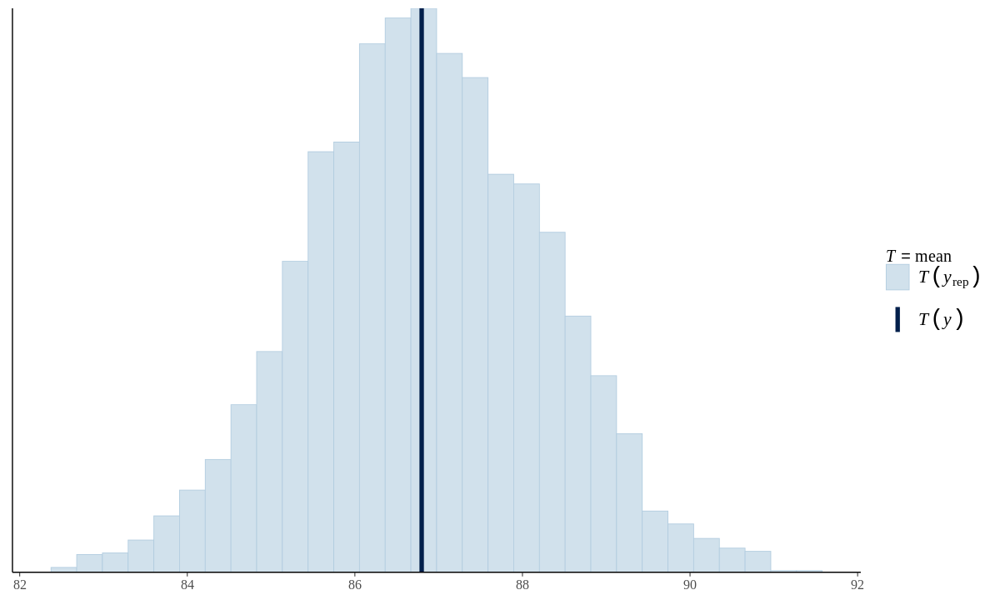

In [ ]:
pp_check(m1, plotfun = "stat", stat = "mean")

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


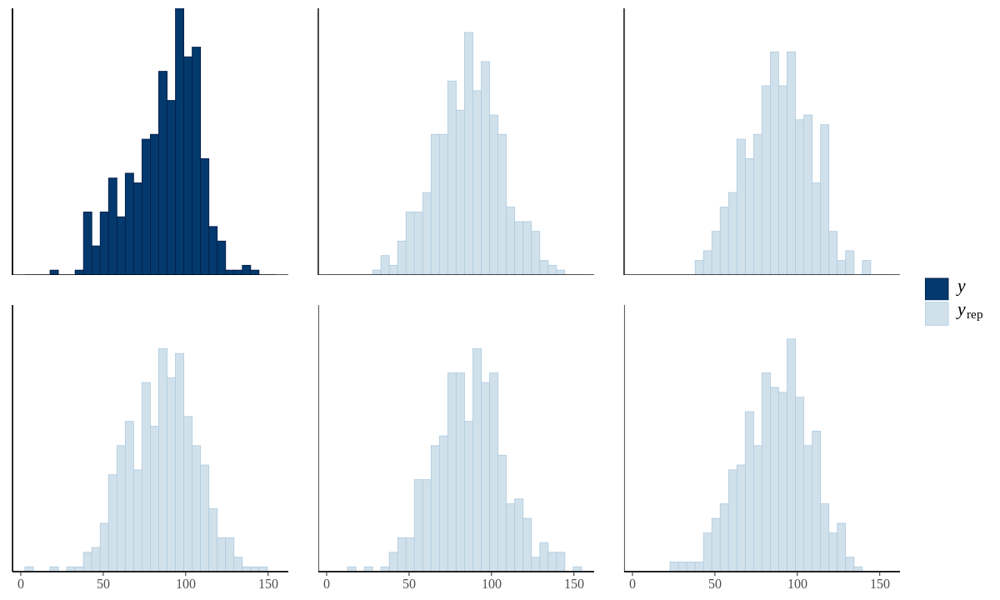

In [ ]:
pp_check(m1, plotfun = "hist", nreps = 5)

In [ ]:
y <- kidiq$kid_score

In [ ]:
yrep_m1 <- posterior_predict(m1, draws = 500)
dim(yrep_m1)

[1] 500 434

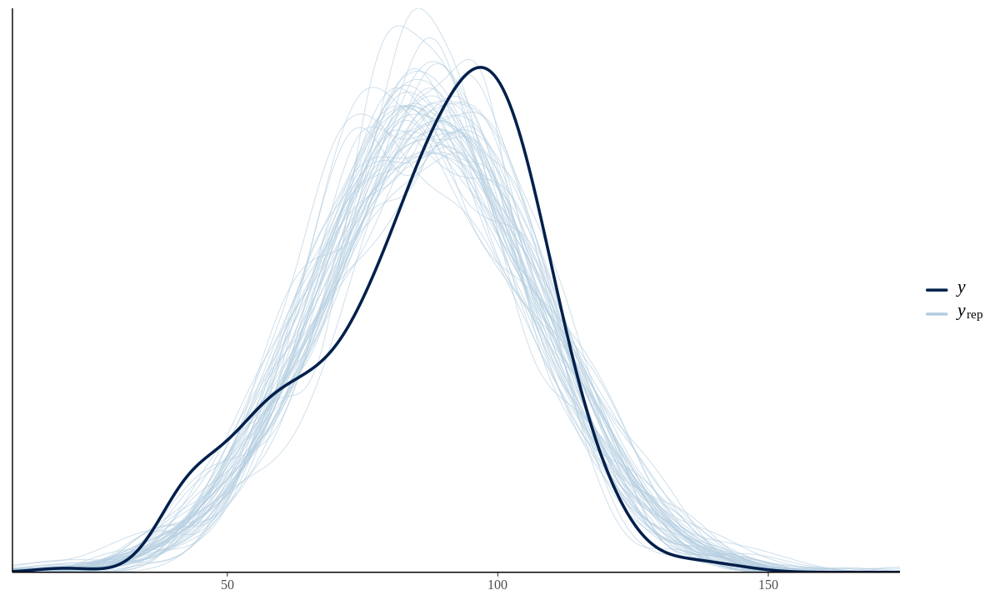

In [ ]:
ppc_dens_overlay(y, yrep_m1[1:50, ])

[loo](https://mc-stan.org/loo/index.html): Efficient approximate leave-one-out cross-validation for fitted Bayesian models

From existing posterior simulation draws, we compute approximate `LOO-CV` using Pareto smoothed importance sampling (`PSIS`), a new procedure for regularizing importance weights. As a byproduct of our calculations, we also obtain approximate standard errors for estimated predictive errors and for comparing predictive errors between two models. We recommend `PSIS-LOO-CV` instead of `WAIC`, because `PSIS` provides useful diagnostics and effective sample size and Monte Carlo standard error estimates.

[`loo`](https://mc-stan.org/rstanarm/reference/loo.stanreg.html): For models fit using MCMC, compute approximate leave-one-out cross-validation (`LOO`, `LOOIC`) or, less preferably, the Widely Applicable Information Criterion (`WAIC`) using the loo package. (For 𝐾-fold cross-validation see `kfold.stanreg`.) Functions for model comparison, and model weighting/averaging are also provided.

Estimates the expected log pointwise predictive density (elpd) using Pareto-smoothed importance sampling leave-one-out cross-validation (PSIS-LOO-CV). Also calculates LOO's standard error and the effective number of parameters. Read more theory here https://arxiv.org/abs/1507.04544 and here https://arxiv.org/abs/1507.02646

In [ ]:
loo1 = loo(m1)
loo1


Computed from 4000 by 434 log-likelihood matrix

         Estimate   SE
elpd_loo  -1926.3 14.2
p_loo         1.9  0.2
looic      3852.5 28.3
------
Monte Carlo SE of elpd_loo is 0.0.

All Pareto k estimates are good (k < 0.5).
See help('pareto-k-diagnostic') for details.

[LOO package glossary](https://mc-stan.org/loo/reference/loo-glossary.html)

`elpd`: approximated expected log pointwise predictive density (elpd).

`se`: standard error of the elpd.

`p_loo`: effective number of parameters. If we have a well-specified model, we expect the estimated effective number of parameters (`p_loo`) to be smaller than or similar to the total number of parameters in the model.

Pareto 𝑘 diagnostic values are used to assess the reliability of the estimates. In addition to the proportion of leave-one-out folds with 𝑘 values in different intervals, the minimum of the effective sample sizes in that category is shown to give idea why higher 𝑘 values are bad.

---

# An index variable (or a binary indicator)

### Estimating a difference is the same as regressing on an indicator variable (Student's two-sample t-test)

## Summarize variables

In [ ]:
tapply(kidiq$kid_score, kidiq$mom_hs, summary)

$`0`
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  20.00   58.00   80.00   77.55   95.00  136.00 

$`1`
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  38.00   77.00   92.00   89.32  103.00  144.00 


In [ ]:
kidiq %>%
  dplyr::select(mom_hs, kid_score) %>%
  group_by(mom_hs) %>%
  summarise(count = n(),
            mean = mean(kid_score),
            std = sd(kid_score),
            min = min(kid_score),
            `25%` = quantile(kid_score, 0.25),
            `50%` = quantile(kid_score, 0.25),
            `75%` = quantile(kid_score, 0.75),
            max = max(kid_score)) %>%
  round(., 1)

mom_hs,count,mean,std,min,25%,50%,75%,max
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
0,93,77.5,22.6,20,58,58,95,136
1,341,89.3,19.0,38,77,77,103,144


## Plot data

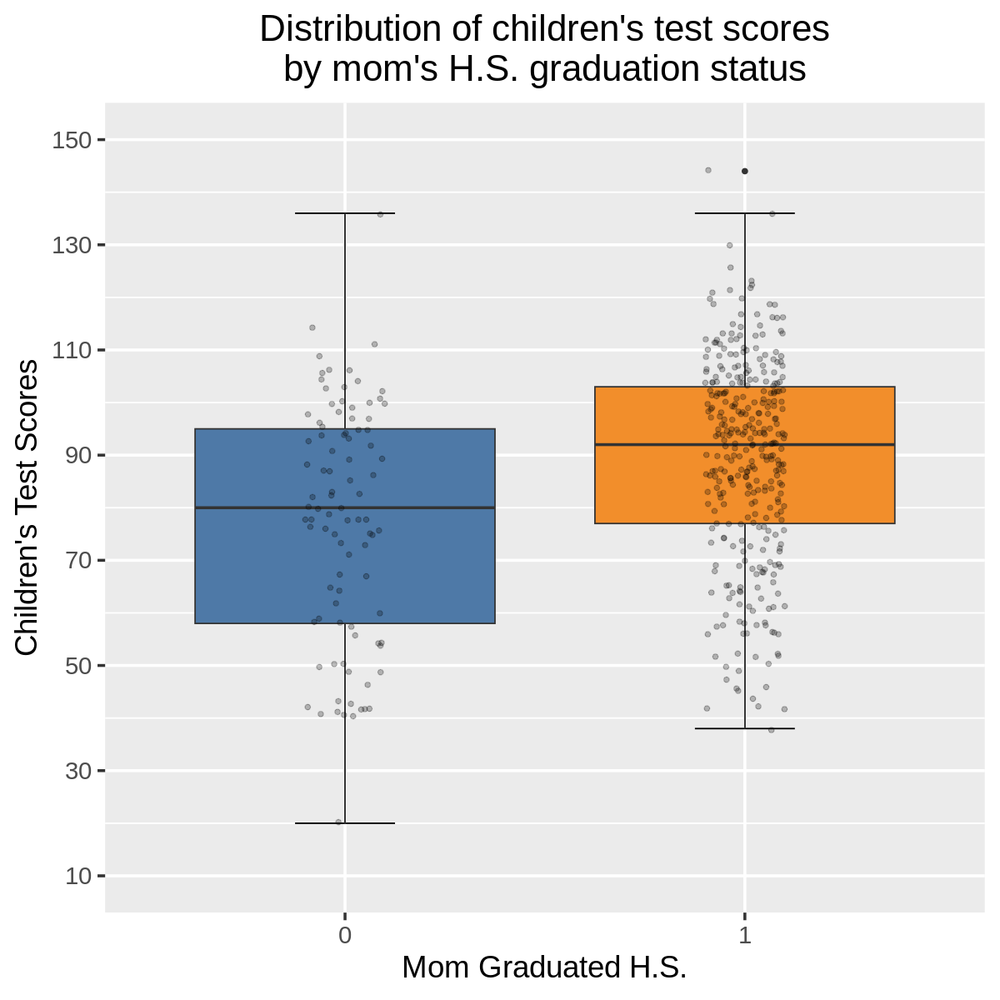

In [ ]:
options(repr.plot.width = 10, repr.plot.height = 10)

ggplot(kidiq, aes(x = factor(mom_hs), y = kid_score)) +
  stat_boxplot(geom = "errorbar", width = 0.25) +
  geom_boxplot(fill = c("#4E79A7",
                        "#F28E2B")) +
  geom_jitter(width = 0.1, alpha = 0.25) +
  scale_y_continuous(limits = c(10, 150),
                     breaks = seq(10, 150, 20)) +
  labs(x = 'Mom Graduated H.S.',
       y = 'Children\'s Test Scores',
       title = "Distribution of children's test scores\nby mom's H.S. graduation status") +
  theme_grey(base_size = 22) +
  theme(plot.title = element_text(hjust = 0.5))

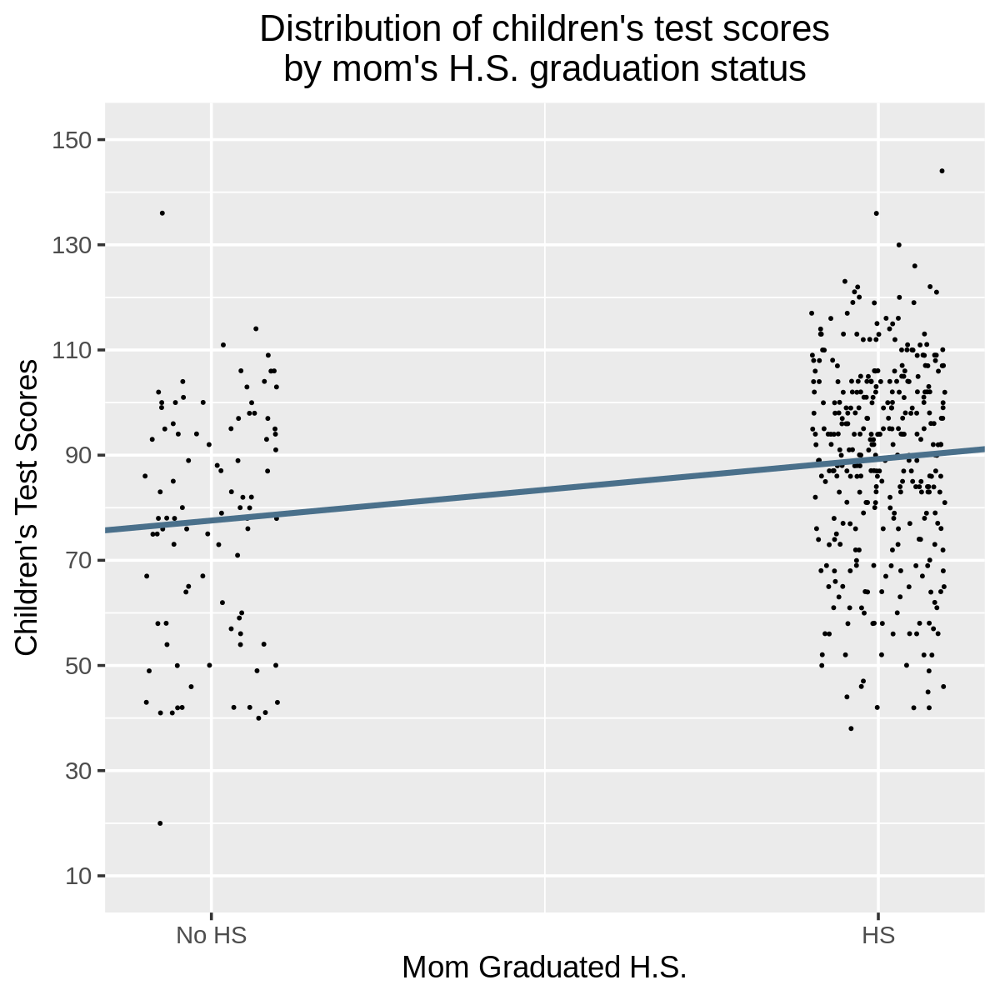

In [ ]:
post1 <- stan_glm(kid_score ~ mom_hs, data = kidiq,
                  family = gaussian(link = "identity"),
                  seed = 12345,
                  refresh = 0)

options(repr.plot.width = 10, repr.plot.height = 10)

base <- ggplot(kidiq, aes(x = mom_hs, y = kid_score)) +
  geom_point(size = 1,
             position = position_jitter(height = 0.05,
                                        width = 0.1)) +
  scale_x_continuous(breaks = c(0,1),
                     labels = c("No HS", "HS"))

base +
  geom_abline(intercept = coef(post1)[1],
              slope = coef(post1)[2],
              color = "skyblue4",
              linewidth = 2) +
  scale_y_continuous(limits = c(10, 150),
                     breaks = seq(10, 150, 20)) +
  labs(x = 'Mom Graduated H.S.',
       y = 'Children\'s Test Scores',
       title = "Distribution of children's test scores\nby mom's H.S. graduation status") +
  theme_grey(base_size = 22) +
  theme(plot.title = element_text(hjust = 0.5))

## Plot model

In [ ]:
m2 <- stan_glm(kid_score ~ 1 + mom_hs, data = kidiq,
               family = gaussian(link = "identity"),
               seed = 12345,
               refresh = 0)

m2

stan_glm
 family:       gaussian [identity]
 formula:      kid_score ~ 1 + mom_hs
 observations: 434
 predictors:   2
------
            Median MAD_SD
(Intercept) 77.6    2.1  
mom_hs      11.7    2.3  

Auxiliary parameter(s):
      Median MAD_SD
sigma 19.9    0.7  

------
* For help interpreting the printed output see ?print.stanreg
* For info on the priors used see ?prior_summary.stanreg

In [ ]:
summary(m2)


Model Info:
 function:     stan_glm
 family:       gaussian [identity]
 formula:      kid_score ~ 1 + mom_hs
 algorithm:    sampling
 sample:       4000 (posterior sample size)
 priors:       see help('prior_summary')
 observations: 434
 predictors:   2

Estimates:
              mean   sd   10%   50%   90%
(Intercept) 77.6    2.1 75.0  77.6  80.3 
mom_hs      11.7    2.3  8.8  11.7  14.7 
sigma       19.9    0.7 19.0  19.9  20.8 

Fit Diagnostics:
           mean   sd   10%   50%   90%
mean_PPD 86.8    1.4 85.1  86.8  88.6 

The mean_ppd is the sample average posterior predictive distribution of the outcome variable (for details see help('summary.stanreg')).

MCMC diagnostics
              mcse Rhat n_eff
(Intercept)   0.0  1.0  4012 
mom_hs        0.0  1.0  4050 
sigma         0.0  1.0  3490 
mean_PPD      0.0  1.0  4031 
log-posterior 0.0  1.0  1925 

For each parameter, mcse is Monte Carlo standard error, n_eff is a crude measure of effective sample size, and Rhat is the potential 

## Plot MCMC diagnostics

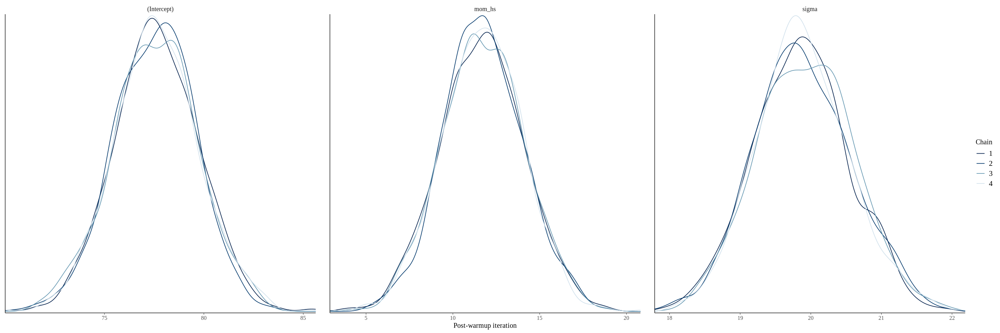

In [ ]:
options(repr.plot.width = 24, repr.plot.height = 8)
mcmc_dens_overlay(m2) +
  xlab("Post-warmup iteration")

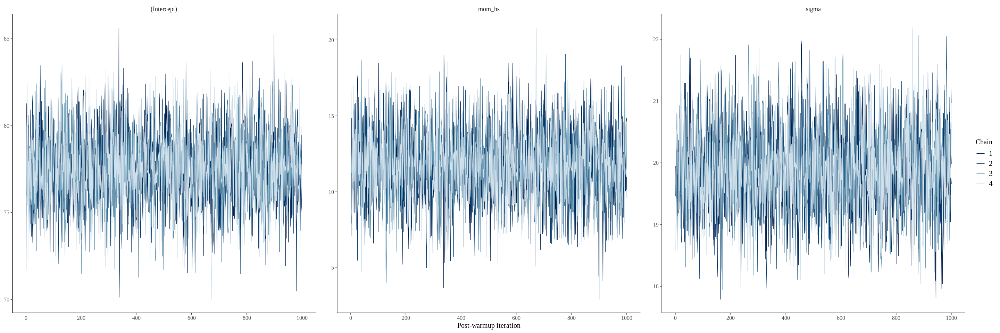

In [ ]:
options(repr.plot.width = 24, repr.plot.height = 8)
mcmc_trace(m2) +
  xlab("Post-warmup iteration")

## Plot posterior distributions

In [ ]:
m2_post <- as.array(m2)
dim(m2_post)

[1] 1000    4    3

In [ ]:
dimnames(m2_post)

$iterations
NULL

$chains
[1] "chain:1" "chain:2" "chain:3" "chain:4"

$parameters
[1] "(Intercept)" "mom_hs"      "sigma"

In [ ]:
m2_post <- as.matrix(m2)
dim(m2_post)

[1] 4000    3

In [ ]:
dimnames(m2_post)

$iterations
NULL

$parameters
[1] "(Intercept)" "mom_hs"      "sigma"

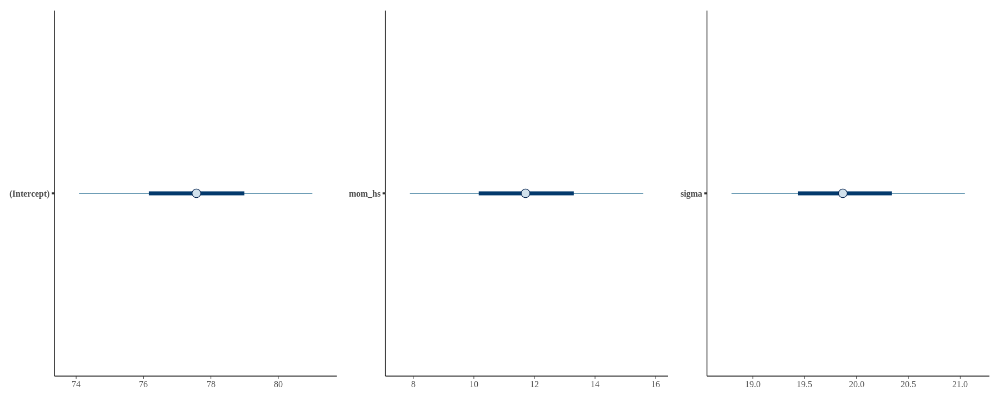

In [ ]:
options(repr.plot.width = 15, repr.plot.height = 6)
g1 <- mcmc_intervals(m2_post, pars = c("(Intercept)"))
g2 <- mcmc_intervals(m2_post, pars = c("mom_hs"))
g3 <- mcmc_intervals(m2_post, pars = c("sigma"))
g1 + g2 + g3

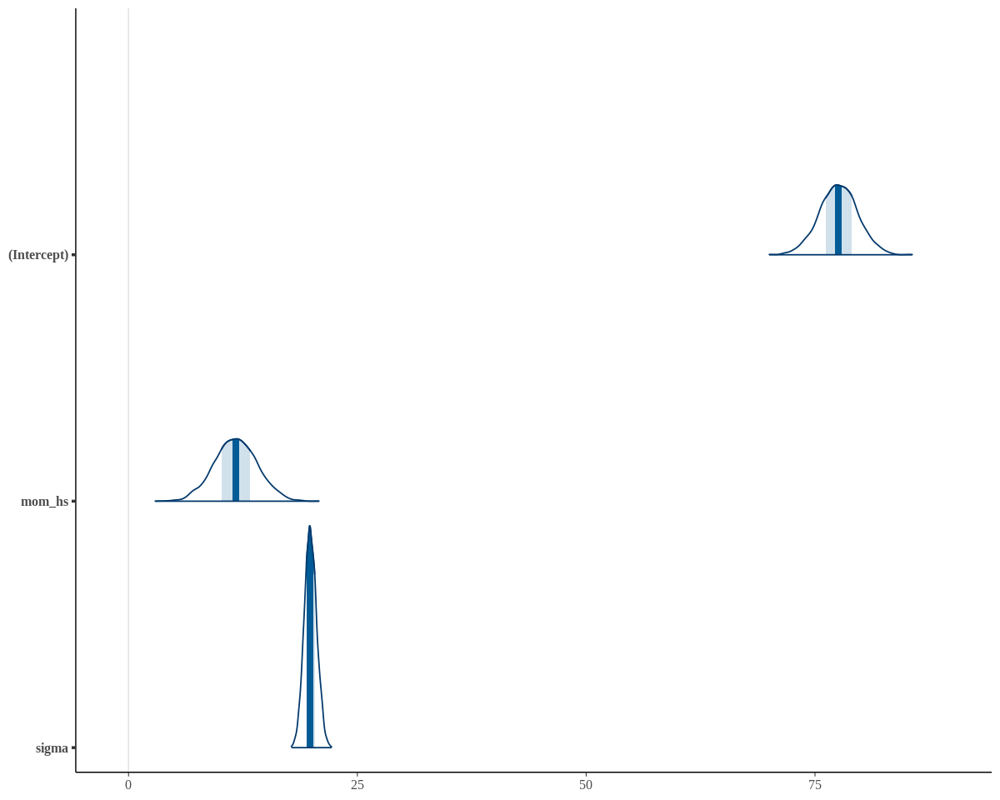

In [ ]:
options(repr.plot.width = 10, repr.plot.height = 8)
mcmc_areas(m2_post)

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


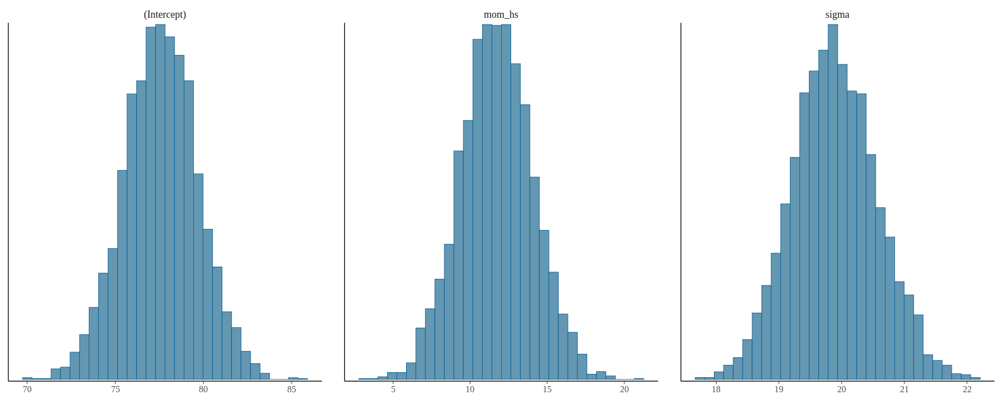

In [ ]:
options(repr.plot.width = 15, repr.plot.height = 6)
mcmc_hist(m2_post)

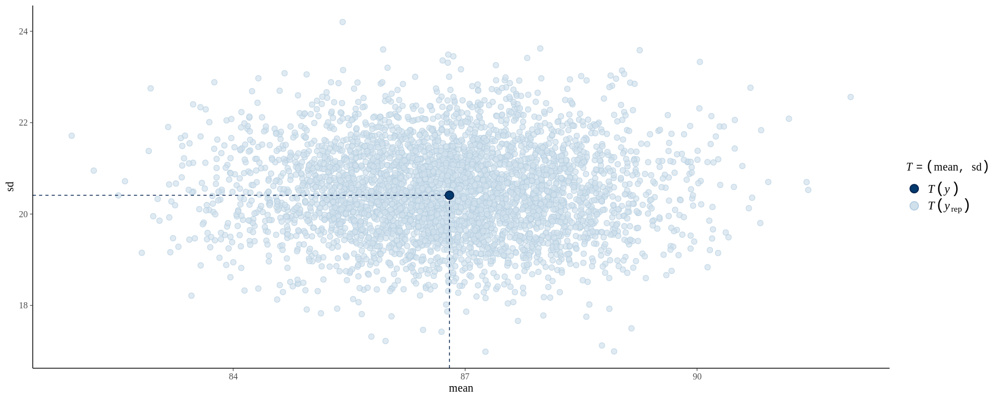

In [ ]:
pp_check(m2, plotfun = "stat_2d", stat = c("mean", "sd"))

## Interpret results

In [ ]:
print(m2)

stan_glm
 family:       gaussian [identity]
 formula:      kid_score ~ 1 + mom_hs
 observations: 434
 predictors:   2
------
            Median MAD_SD
(Intercept) 77.6    2.1  
mom_hs      11.7    2.3  

Auxiliary parameter(s):
      Median MAD_SD
sigma 19.9    0.7  

------
* For help interpreting the printed output see ?print.stanreg
* For info on the priors used see ?prior_summary.stanreg


## Plot posterior predictive distributions

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


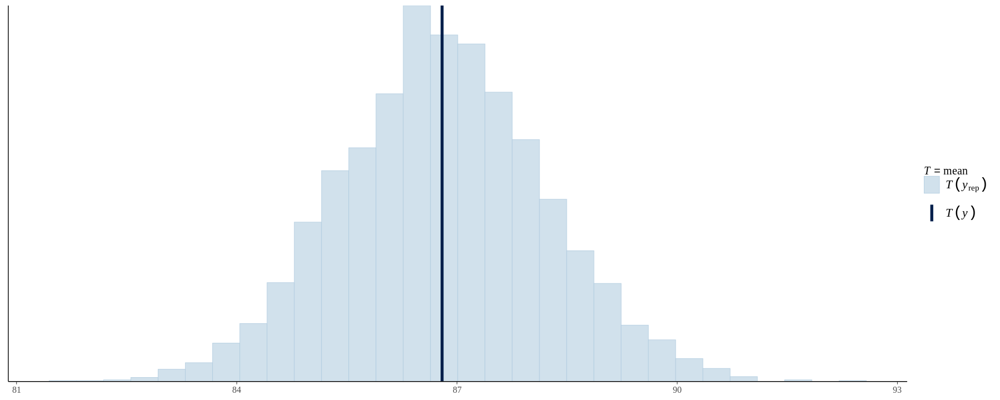

In [ ]:
pp_check(m2, plotfun = "stat", stat = "mean")

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


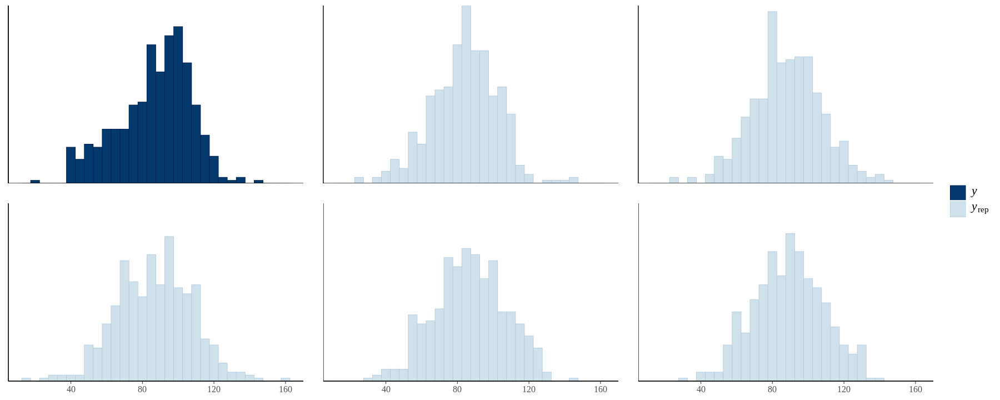

In [ ]:
pp_check(m2, plotfun = "hist", nreps = 5)

In [ ]:
y <- kidiq$kid_score

In [ ]:
yrep_m2 <- posterior_predict(m2, draws = 500)
dim(yrep_m2)

[1] 500 434

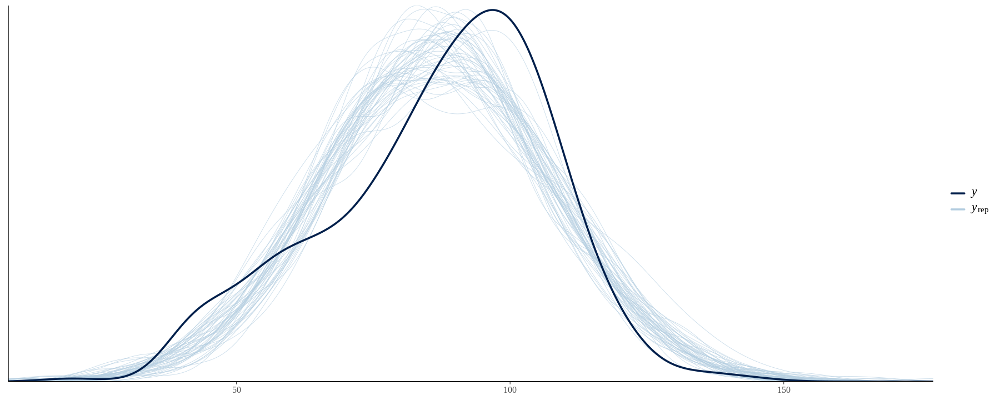

In [ ]:
ppc_dens_overlay(y, yrep_m2[1:50, ])

In [ ]:
loo2 = loo(m2)
loo2


Computed from 4000 by 434 log-likelihood matrix

         Estimate   SE
elpd_loo  -1914.9 13.8
p_loo         3.1  0.3
looic      3829.8 27.6
------
Monte Carlo SE of elpd_loo is 0.0.

All Pareto k estimates are good (k < 0.5).
See help('pareto-k-diagnostic') for details.

In [ ]:
draws <- as.data.frame(m2)
colnames(draws)[1:2] <- c("a", "b")
glimpse(draws)

Rows: 4,000
Columns: 3
$ a     <dbl> 73.70187, 81.26330, 76.57400, 79.31881, 77.29652, 77.45243, 75.8…
$ b     <dbl> 16.611789, 7.125347, 14.830254, 7.926255, 11.469044, 12.473920, …
$ sigma <dbl> 19.46762, 19.88991, 20.80056, 19.55600, 19.61915, 19.69630, 20.3…


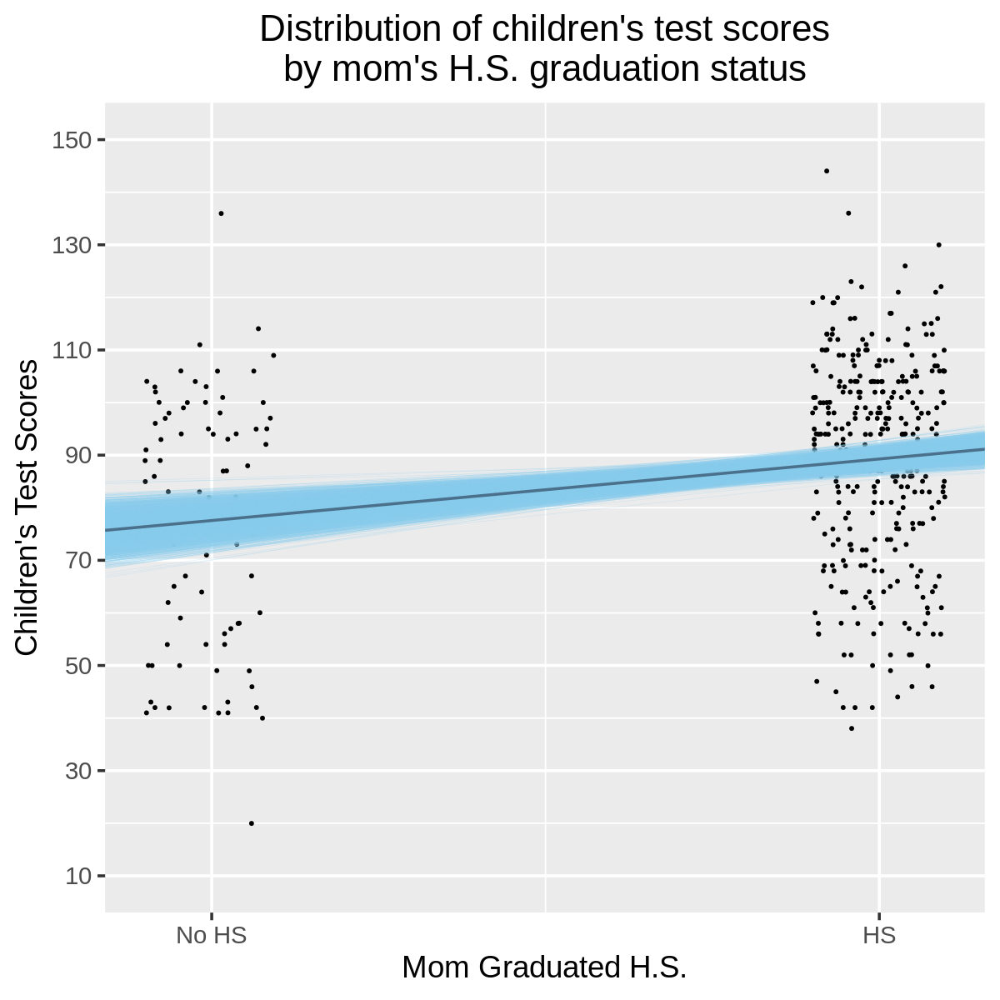

In [ ]:
options(repr.plot.width = 10, repr.plot.height = 10)

base +
  geom_abline(data = draws, aes(intercept = a, slope = b),
              color = "skyblue", linewidth = 0.2, alpha = 0.25) +
  geom_abline(intercept = coef(m2)[1], slope = coef(m2)[2],
              color = "skyblue4", linewidth = 1) +
  scale_y_continuous(limits = c(10, 150),
                     breaks = seq(10, 150, 20)) +
  labs(x = 'Mom Graduated H.S.',
       y = 'Children\'s Test Scores',
       title = "Distribution of children's test scores\nby mom's H.S. graduation status") +
  theme_grey(base_size = 22) +
  theme(plot.title = element_text(hjust = 0.5))

---

# A continuous variable

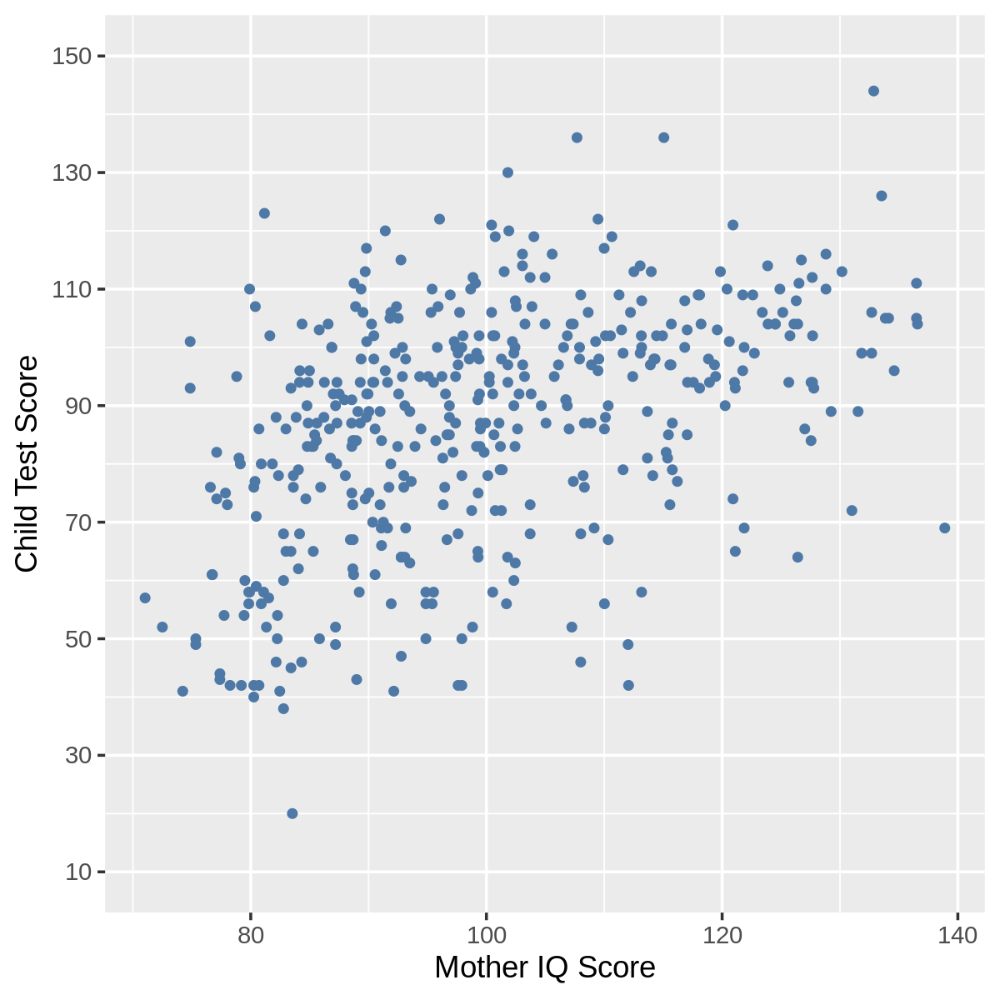

In [ ]:
options(repr.plot.width = 10, repr.plot.height = 10)

ggplot(kidiq, aes(x = mom_iq, y = kid_score)) +
  geom_point(size = 3, colour = "#4E79A7") +
  scale_y_continuous(limits = c(10, 150),
                     breaks = seq(10, 150, 20)) +
  labs(x = 'Mother IQ Score',
       y = 'Child Test Score') +
  theme_grey(base_size = 22) +
  theme(plot.title = element_text(hjust = 0.5))

## Plot model

In [ ]:
m3 <- stan_glm(kid_score ~ 1 + mom_iq, data = kidiq,
               family = gaussian(link = "identity"),
               seed = 12345,
               refresh = 0)

m3

stan_glm
 family:       gaussian [identity]
 formula:      kid_score ~ 1 + mom_iq
 observations: 434
 predictors:   2
------
            Median MAD_SD
(Intercept) 25.7    5.9  
mom_iq       0.6    0.1  

Auxiliary parameter(s):
      Median MAD_SD
sigma 18.3    0.6  

------
* For help interpreting the printed output see ?print.stanreg
* For info on the priors used see ?prior_summary.stanreg

In [ ]:
summary(m3)


Model Info:
 function:     stan_glm
 family:       gaussian [identity]
 formula:      kid_score ~ 1 + mom_iq
 algorithm:    sampling
 sample:       4000 (posterior sample size)
 priors:       see help('prior_summary')
 observations: 434
 predictors:   2

Estimates:
              mean   sd   10%   50%   90%
(Intercept) 25.7    6.0 18.1  25.7  33.3 
mom_iq       0.6    0.1  0.5   0.6   0.7 
sigma       18.3    0.6 17.5  18.3  19.1 

Fit Diagnostics:
           mean   sd   10%   50%   90%
mean_PPD 86.8    1.2 85.2  86.8  88.4 

The mean_ppd is the sample average posterior predictive distribution of the outcome variable (for details see help('summary.stanreg')).

MCMC diagnostics
              mcse Rhat n_eff
(Intercept)   0.1  1.0  3723 
mom_iq        0.0  1.0  3714 
sigma         0.0  1.0  3628 
mean_PPD      0.0  1.0  3758 
log-posterior 0.0  1.0  1657 

For each parameter, mcse is Monte Carlo standard error, n_eff is a crude measure of effective sample size, and Rhat is the potential 

## Plot MCMC diagnostics

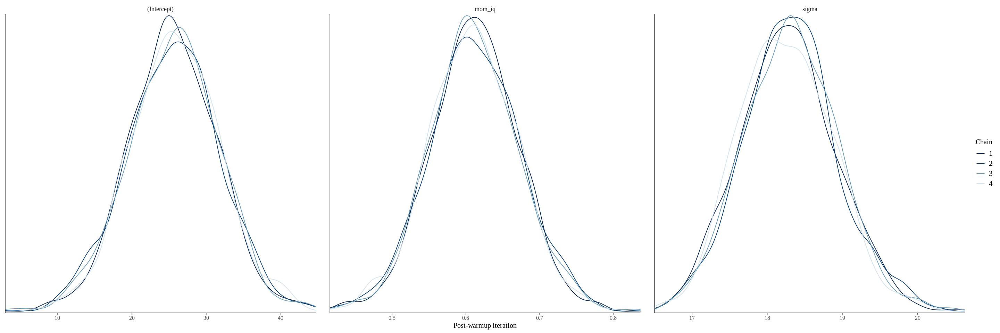

In [ ]:
options(repr.plot.width = 24, repr.plot.height = 8)
mcmc_dens_overlay(m3) +
  xlab("Post-warmup iteration")

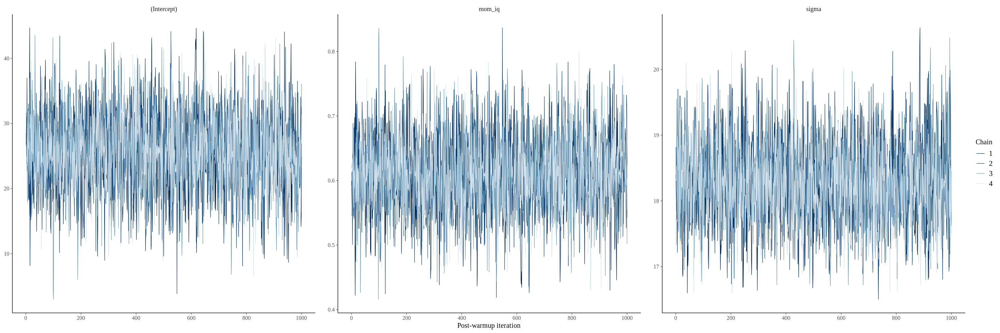

In [ ]:
options(repr.plot.width = 24, repr.plot.height = 8)
mcmc_trace(m3) +
  xlab("Post-warmup iteration")

## Plot posterior distributions

In [ ]:
m3_post <- as.array(m3)
dim(m3_post)

[1] 1000    4    3

In [ ]:
dimnames(m3_post)

$iterations
NULL

$chains
[1] "chain:1" "chain:2" "chain:3" "chain:4"

$parameters
[1] "(Intercept)" "mom_iq"      "sigma"

In [ ]:
m3_post <- as.matrix(m3)
dim(m3_post)

[1] 4000    3

In [ ]:
dimnames(m3_post)

$iterations
NULL

$parameters
[1] "(Intercept)" "mom_iq"      "sigma"

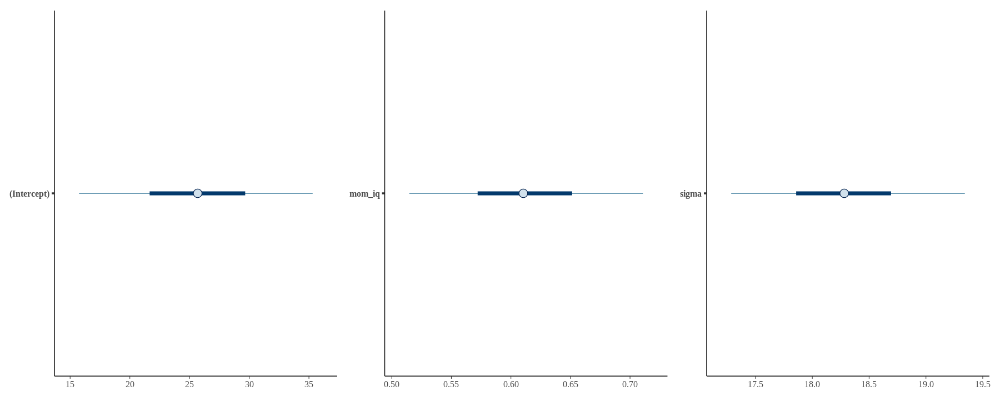

In [ ]:
options(repr.plot.width = 15, repr.plot.height = 6)
g1 <- mcmc_intervals(m3_post, pars = c("(Intercept)"))
g2 <- mcmc_intervals(m3_post, pars = c("mom_iq"))
g3 <- mcmc_intervals(m3_post, pars = c("sigma"))
g1 + g2 + g3

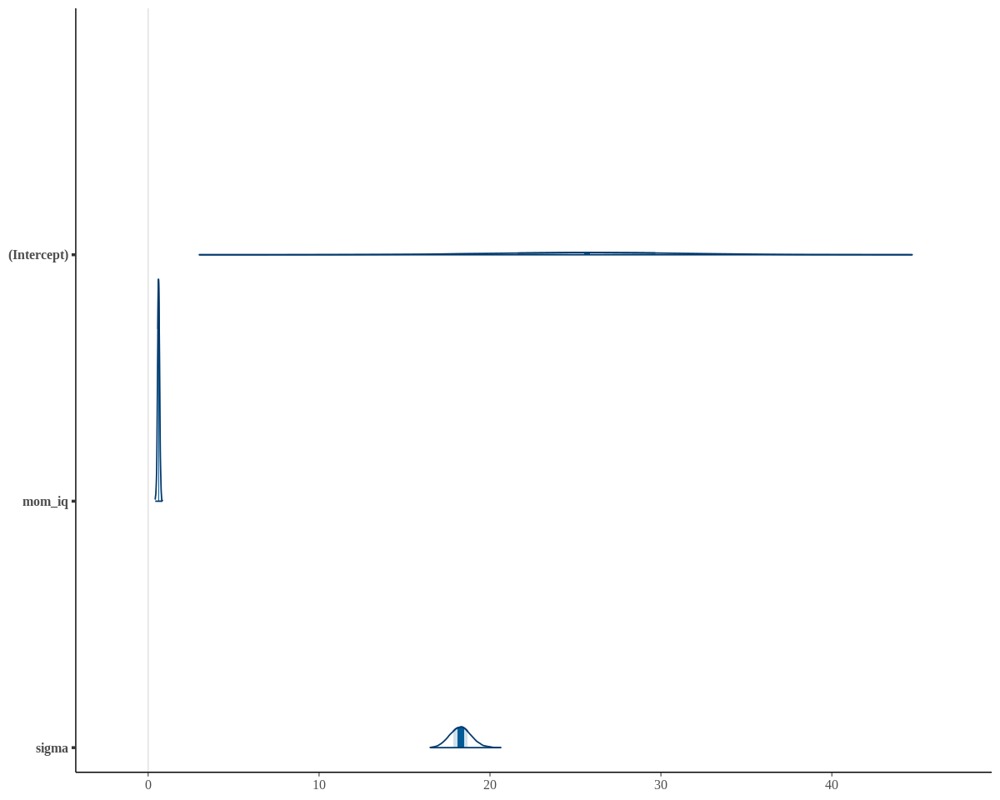

In [ ]:
options(repr.plot.width = 10, repr.plot.height = 8)
mcmc_areas(m3_post)

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


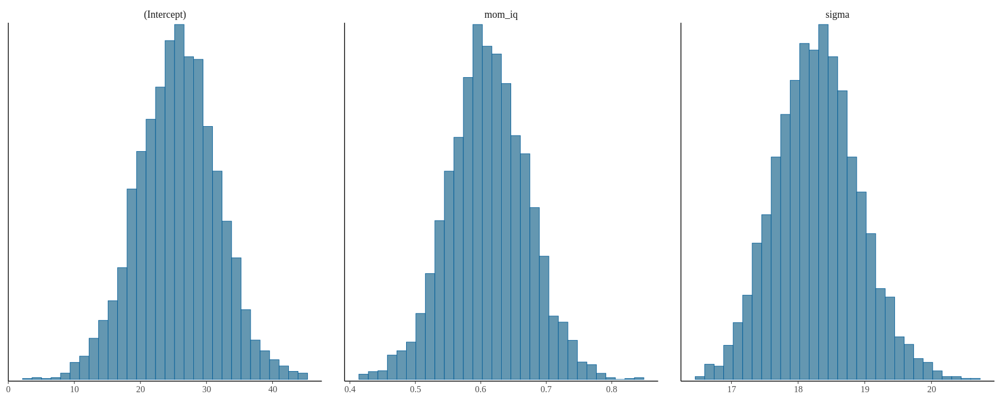

In [ ]:
options(repr.plot.width = 15, repr.plot.height = 6)
mcmc_hist(m3_post)

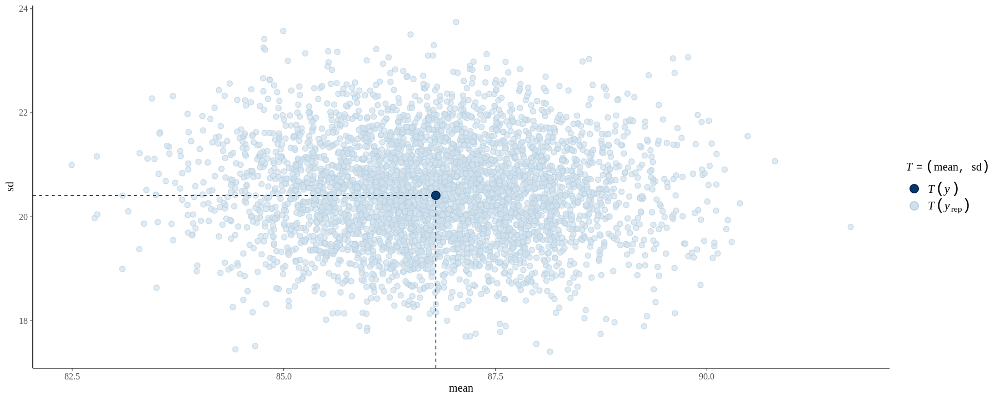

In [ ]:
pp_check(m3, plotfun = "stat_2d", stat = c("mean", "sd"))

## Interpret results

In [ ]:
print(m3)

stan_glm
 family:       gaussian [identity]
 formula:      kid_score ~ 1 + mom_iq
 observations: 434
 predictors:   2
------
            Median MAD_SD
(Intercept) 25.7    5.9  
mom_iq       0.6    0.1  

Auxiliary parameter(s):
      Median MAD_SD
sigma 18.3    0.6  

------
* For help interpreting the printed output see ?print.stanreg
* For info on the priors used see ?prior_summary.stanreg


## Plot posterior predictive distributions

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


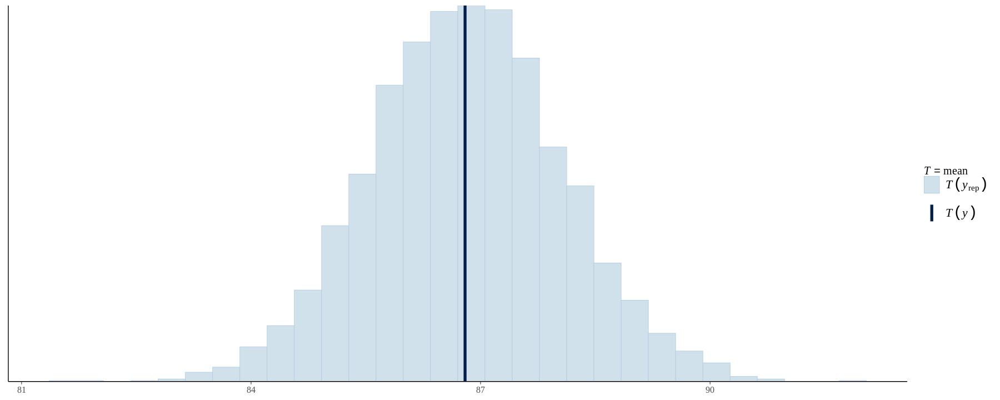

In [ ]:
pp_check(m3, plotfun = "stat", stat = "mean")

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


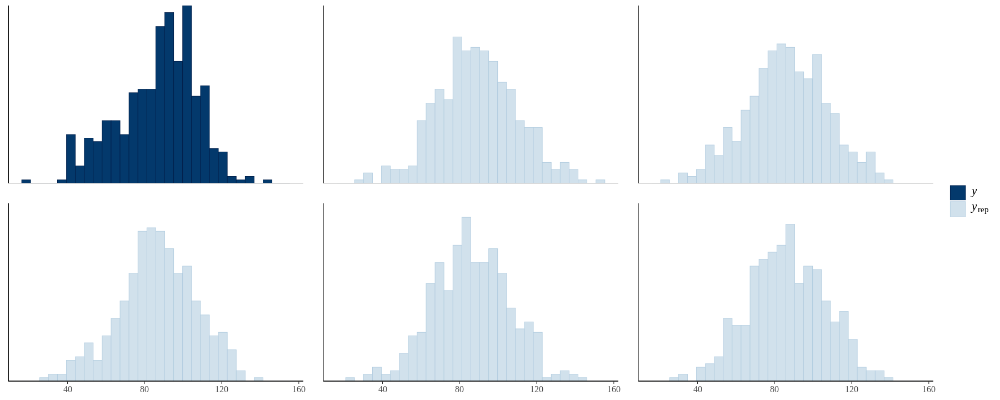

In [ ]:
pp_check(m3, plotfun = "hist", nreps = 5)

In [ ]:
y <- kidiq$kid_score

In [ ]:
yrep_m3 <- posterior_predict(m3, draws = 500)
dim(yrep_m3)

[1] 500 434

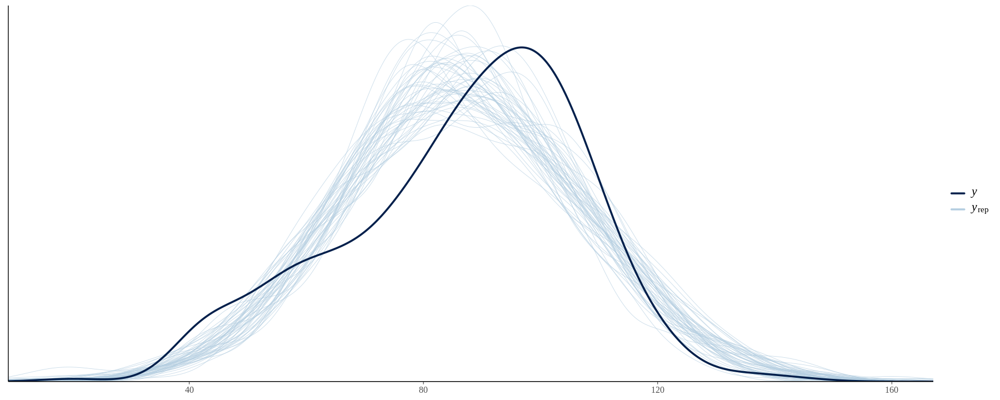

In [ ]:
ppc_dens_overlay(y, yrep_m3[1:50, ])

In [ ]:
loo3 = loo(m3)
loo3


Computed from 4000 by 434 log-likelihood matrix

         Estimate   SE
elpd_loo  -1878.7 14.5
p_loo         3.0  0.3
looic      3757.3 29.0
------
Monte Carlo SE of elpd_loo is 0.0.

All Pareto k estimates are good (k < 0.5).
See help('pareto-k-diagnostic') for details.

In [ ]:
draws <- as.data.frame(m3)
colnames(draws)[1:2] <- c("a", "b")
glimpse(draws)

Rows: 4,000
Columns: 3
$ a     <dbl> 26.476614, 30.992364, 28.695145, 24.344255, 22.673467, 22.871123…
$ b     <dbl> 0.6126939, 0.5594752, 0.5861772, 0.6192252, 0.6389415, 0.6447848…
$ sigma <dbl> 18.40002, 17.91957, 18.70241, 17.71580, 17.89793, 18.11176, 18.1…


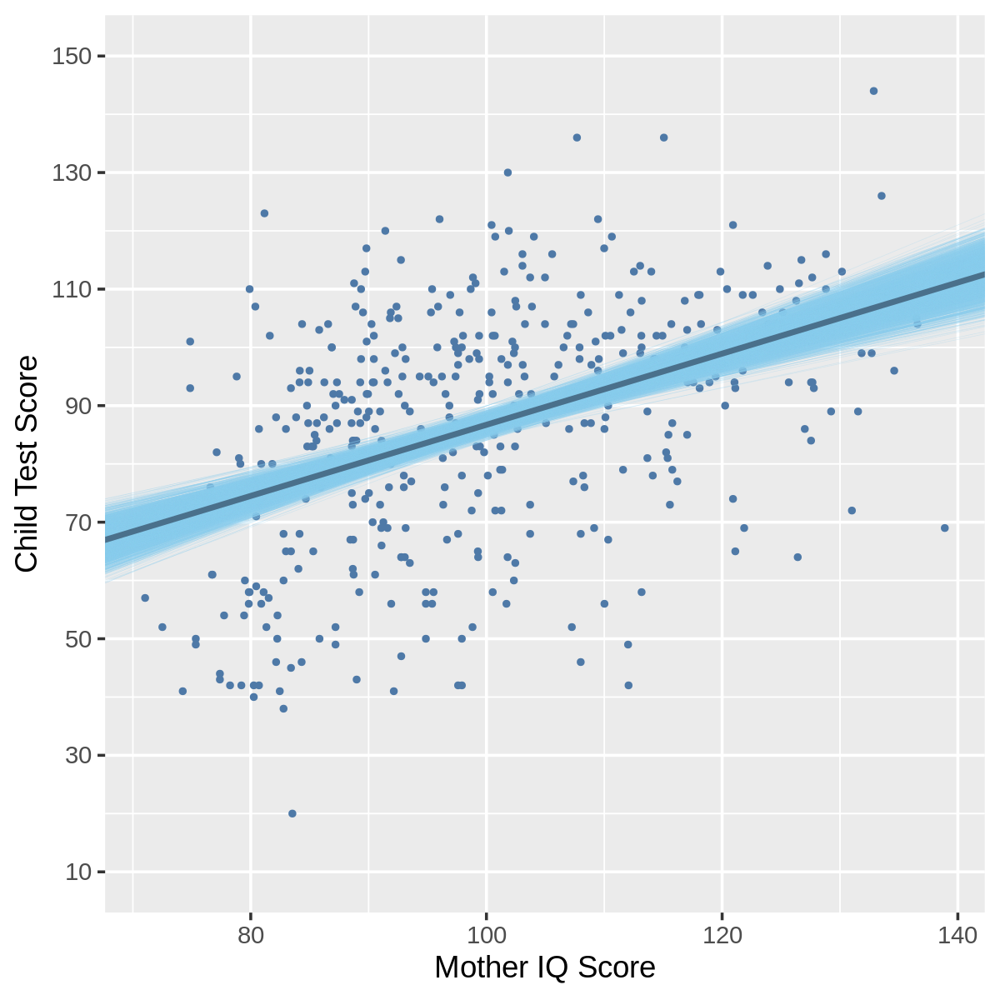

In [ ]:
options(repr.plot.width = 10, repr.plot.height = 10)

ggplot(kidiq, aes(x = mom_iq, y = kid_score)) +
  geom_point(size = 2, colour = "#4E79A7") +
  geom_abline(data = draws, aes(intercept = a, slope = b),
              color = "skyblue", linewidth = 0.2, alpha = 0.25) +
  geom_abline(intercept = coef(m3)[1], slope = coef(m3)[2],
              color = "skyblue4", linewidth = 2) +
  scale_y_continuous(limits = c(10, 150),
                     breaks = seq(10, 150, 20)) +
  labs(x = 'Mother IQ Score',
       y = 'Child Test Score') +
  theme_grey(base_size = 22) +
  theme(plot.title = element_text(hjust = 0.5))

---

## Two predictors: one binary and one continuous (no interaction)

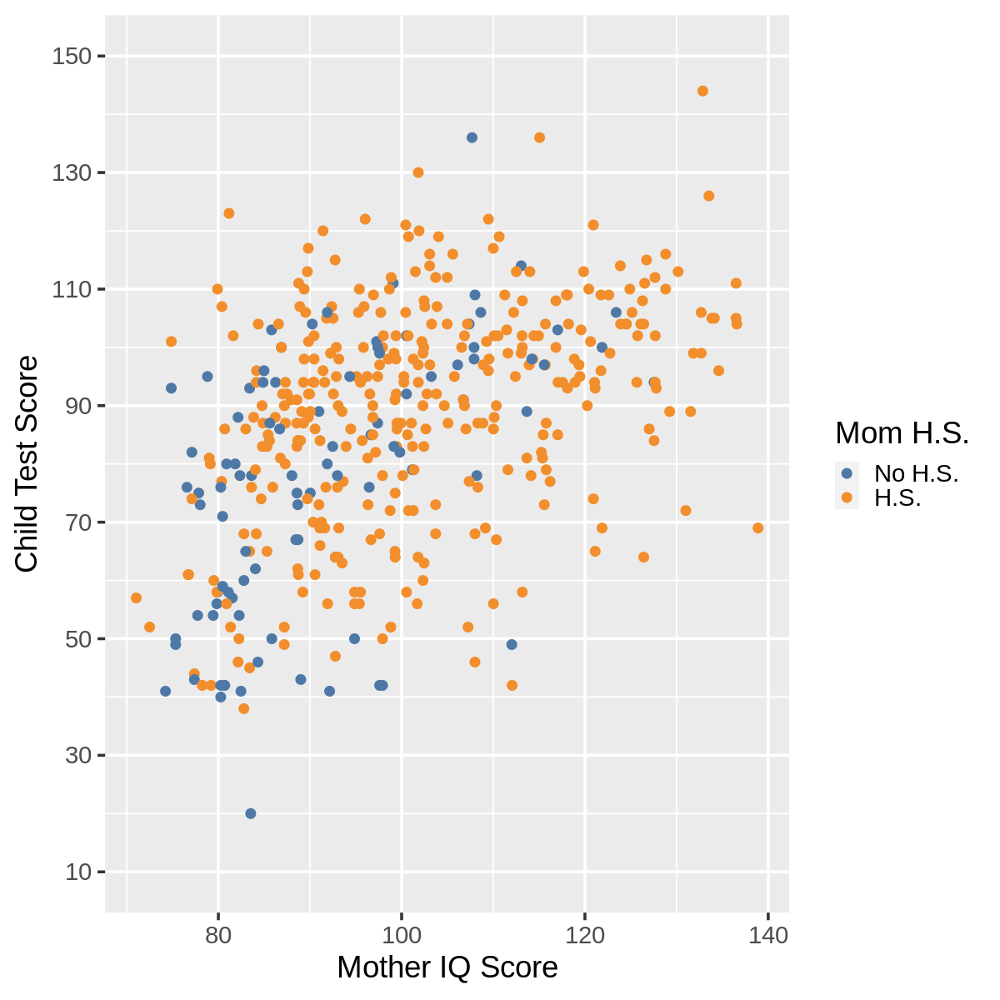

In [ ]:
options(repr.plot.width = 10, repr.plot.height = 10)

ggplot(kidiq, aes(x = mom_iq, y = kid_score, colour = factor(mom_hs))) +
  geom_point(size = 3) +
  scale_color_manual(values = c("#4E79A7", "#F28E2B"),
                     labels = c("No H.S.", "H.S."),
                     name = "Mom H.S.") +
  scale_y_continuous(limits = c(10, 150),
                     breaks = seq(10, 150, 20)) +
  labs(x = 'Mother IQ Score',
       y = 'Child Test Score') +
  theme_grey(base_size = 22) +
  theme(plot.title = element_text(hjust = 0.5))

## Plot model

In [ ]:
m4 <- stan_glm(kid_score ~ 1 + mom_hs + mom_iq, data = kidiq,
               family = gaussian(link = "identity"),
               seed = 12345,
               refresh = 0)

m4

stan_glm
 family:       gaussian [identity]
 formula:      kid_score ~ 1 + mom_hs + mom_iq
 observations: 434
 predictors:   3
------
            Median MAD_SD
(Intercept) 25.7    5.9  
mom_hs       6.0    2.2  
mom_iq       0.6    0.1  

Auxiliary parameter(s):
      Median MAD_SD
sigma 18.1    0.6  

------
* For help interpreting the printed output see ?print.stanreg
* For info on the priors used see ?prior_summary.stanreg

In [ ]:
summary(m4)


Model Info:
 function:     stan_glm
 family:       gaussian [identity]
 formula:      kid_score ~ 1 + mom_hs + mom_iq
 algorithm:    sampling
 sample:       4000 (posterior sample size)
 priors:       see help('prior_summary')
 observations: 434
 predictors:   3

Estimates:
              mean   sd   10%   50%   90%
(Intercept) 25.7    5.9 18.2  25.7  33.2 
mom_hs       6.0    2.2  3.2   6.0   8.9 
mom_iq       0.6    0.1  0.5   0.6   0.6 
sigma       18.2    0.6 17.4  18.1  19.0 

Fit Diagnostics:
           mean   sd   10%   50%   90%
mean_PPD 86.8    1.2 85.3  86.8  88.4 

The mean_ppd is the sample average posterior predictive distribution of the outcome variable (for details see help('summary.stanreg')).

MCMC diagnostics
              mcse Rhat n_eff
(Intercept)   0.1  1.0  4679 
mom_hs        0.0  1.0  4011 
mom_iq        0.0  1.0  4202 
sigma         0.0  1.0  4697 
mean_PPD      0.0  1.0  3948 
log-posterior 0.0  1.0  1834 

For each parameter, mcse is Monte Carlo standard err

## Plot MCMC diagnostics

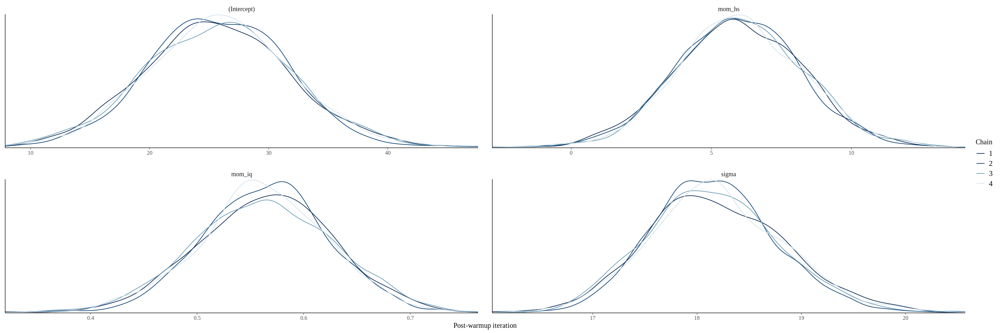

In [ ]:
options(repr.plot.width = 24, repr.plot.height = 8)
mcmc_dens_overlay(m4) +
  xlab("Post-warmup iteration")

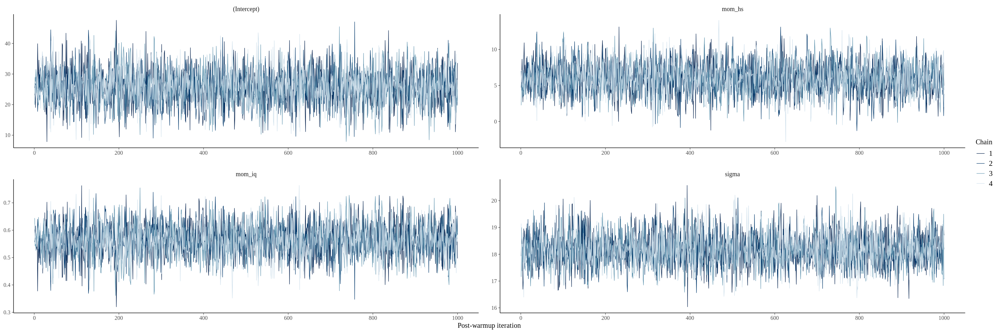

In [ ]:
options(repr.plot.width = 24, repr.plot.height = 8)
mcmc_trace(m4) +
  xlab("Post-warmup iteration")

## Plot posterior distributions

In [ ]:
m4_post <- as.array(m4)
dim(m4_post)

[1] 1000    4    4

In [ ]:
dimnames(m4_post)

$iterations
NULL

$chains
[1] "chain:1" "chain:2" "chain:3" "chain:4"

$parameters
[1] "(Intercept)" "mom_hs"      "mom_iq"      "sigma"

In [ ]:
m4_post <- as.matrix(m4)
dim(m4_post)

[1] 4000    4

In [ ]:
dimnames(m4_post)

$iterations
NULL

$parameters
[1] "(Intercept)" "mom_hs"      "mom_iq"      "sigma"

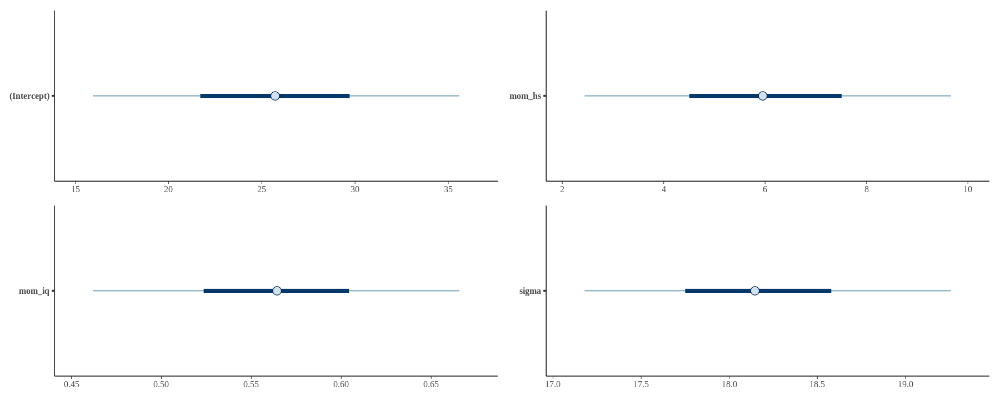

In [ ]:
options(repr.plot.width = 15, repr.plot.height = 6)
g1 <- mcmc_intervals(m4_post, pars = c("(Intercept)"))
g2 <- mcmc_intervals(m4_post, pars = c("mom_hs"))
g3 <- mcmc_intervals(m4_post, pars = c("mom_iq"))
g4 <- mcmc_intervals(m4_post, pars = c("sigma"))
g1 + g2 + g3 + g4

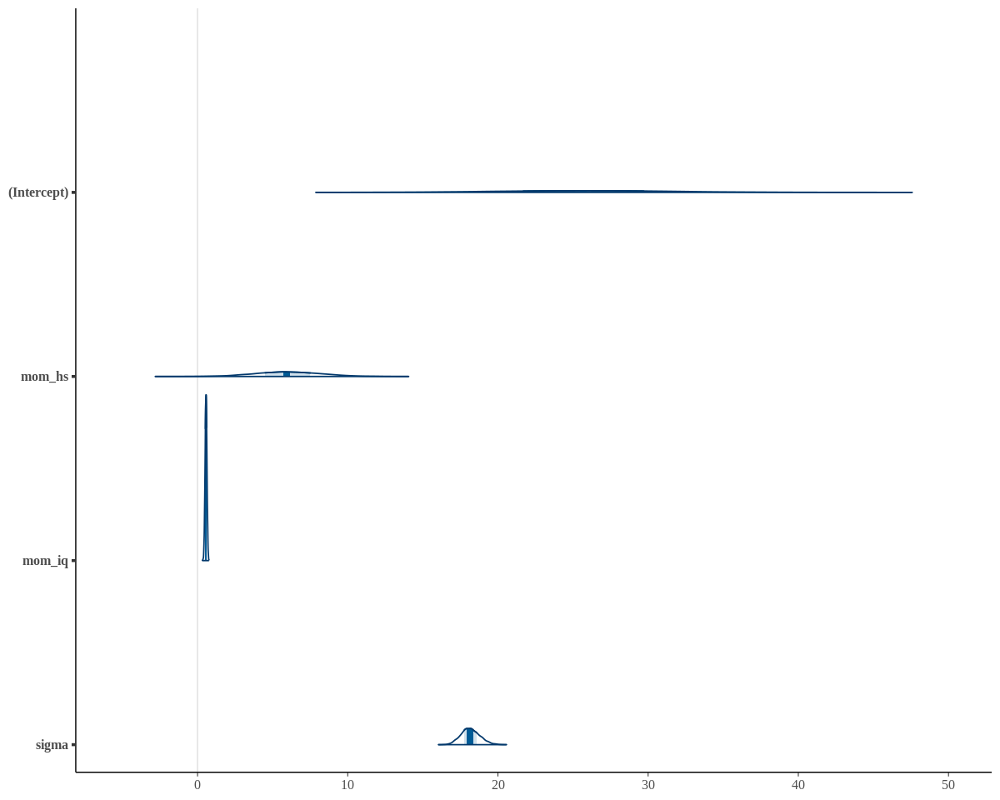

In [ ]:
options(repr.plot.width = 10, repr.plot.height = 8)
mcmc_areas(m4_post)

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


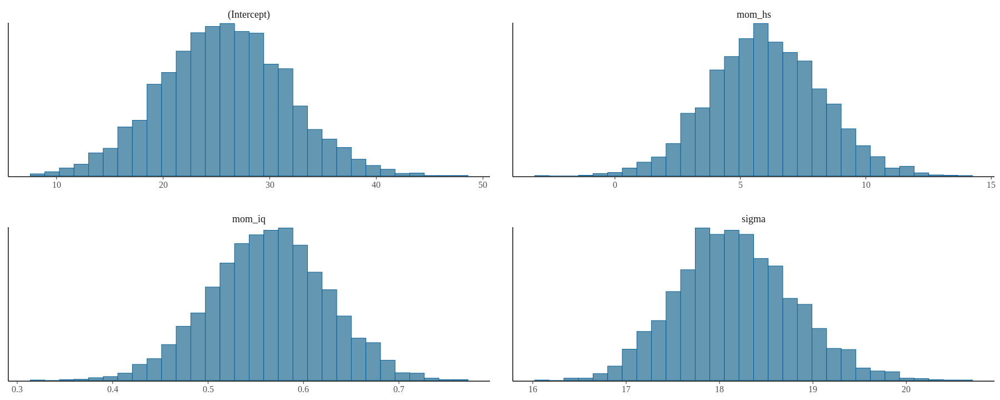

In [ ]:
options(repr.plot.width = 15, repr.plot.height = 6)
mcmc_hist(m4_post)

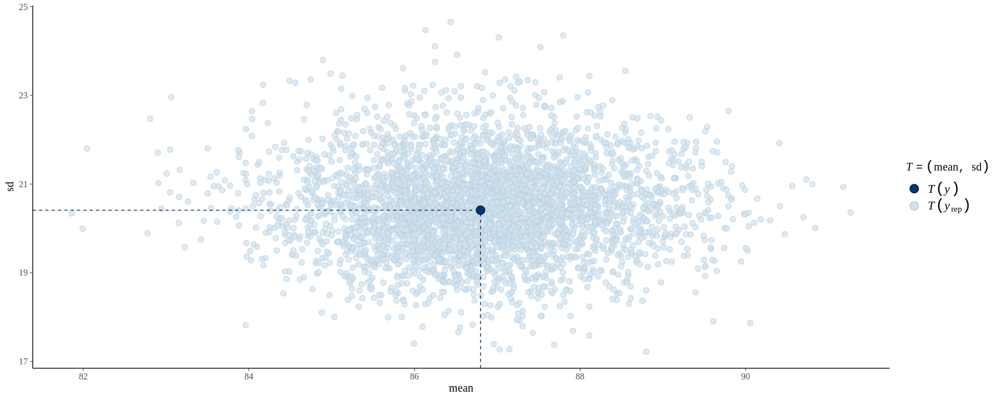

In [ ]:
pp_check(m4, plotfun = "stat_2d", stat = c("mean", "sd"))

## Interpret results

In [ ]:
print(m4)

stan_glm
 family:       gaussian [identity]
 formula:      kid_score ~ 1 + mom_hs + mom_iq
 observations: 434
 predictors:   3
------
            Median MAD_SD
(Intercept) 25.7    5.9  
mom_hs       6.0    2.2  
mom_iq       0.6    0.1  

Auxiliary parameter(s):
      Median MAD_SD
sigma 18.1    0.6  

------
* For help interpreting the printed output see ?print.stanreg
* For info on the priors used see ?prior_summary.stanreg


## Plot posterior predictive distributions

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


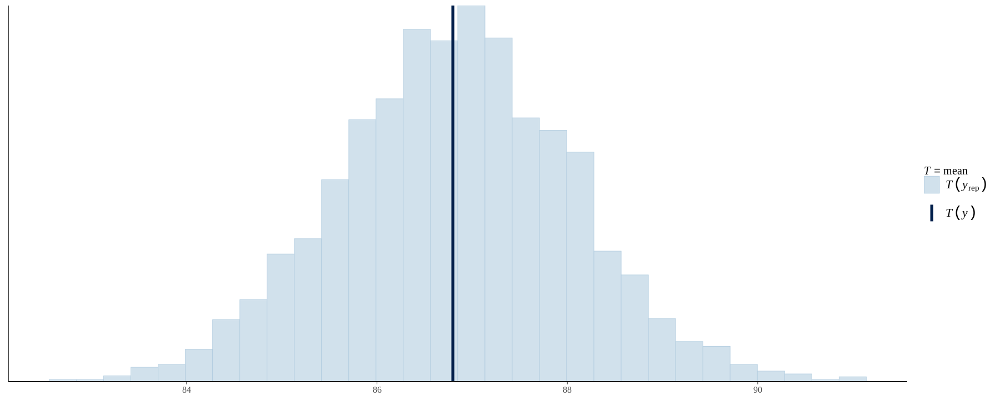

In [ ]:
pp_check(m4, plotfun = "stat", stat = "mean")

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


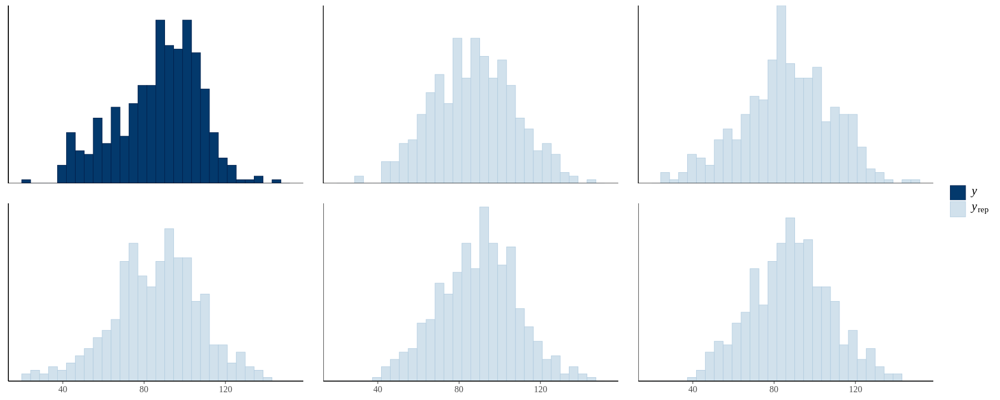

In [ ]:
pp_check(m4, plotfun = "hist", nreps = 5)

In [ ]:
y <- kidiq$kid_score

In [ ]:
yrep_m4 <- posterior_predict(m4, draws = 500)
dim(yrep_m4)

[1] 500 434

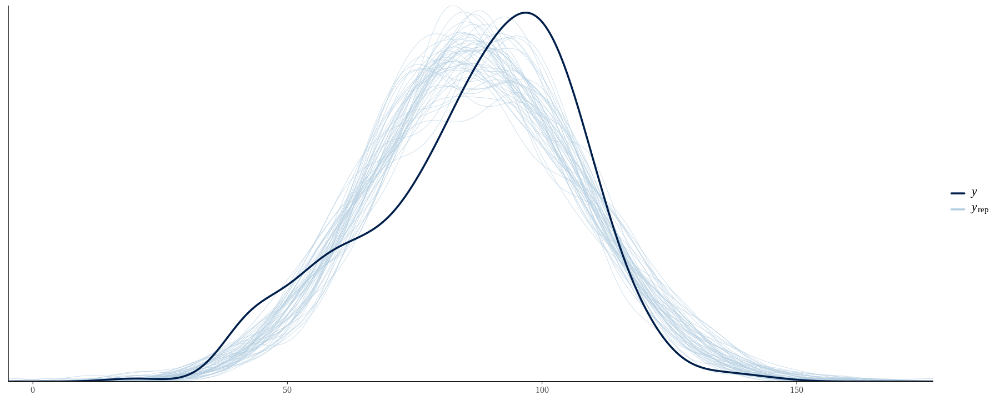

In [ ]:
ppc_dens_overlay(y, yrep_m4[1:50, ])

In [ ]:
loo4 = loo(m4)
loo4


Computed from 4000 by 434 log-likelihood matrix

         Estimate   SE
elpd_loo  -1876.0 14.2
p_loo         4.0  0.4
looic      3752.0 28.4
------
Monte Carlo SE of elpd_loo is 0.0.

All Pareto k estimates are good (k < 0.5).
See help('pareto-k-diagnostic') for details.

In [ ]:
draws <- as.data.frame(m4)
colnames(draws)[1:3] <- c("a", "mom_hs", "mom_iq")
glimpse(draws)

Rows: 4,000
Columns: 4
$ a      <dbl> 23.06477, 24.22873, 19.04032, 25.24816, 28.90158, 29.38116, 23.…
$ mom_hs <dbl> 4.709361, 5.921518, 8.649099, 5.904919, 2.702688, 4.828404, 8.3…
$ mom_iq <dbl> 0.6026161, 0.5796834, 0.6156159, 0.5728600, 0.5506979, 0.529825…
$ sigma  <dbl> 17.93114, 18.62511, 18.47765, 17.83704, 16.69327, 17.03039, 18.…


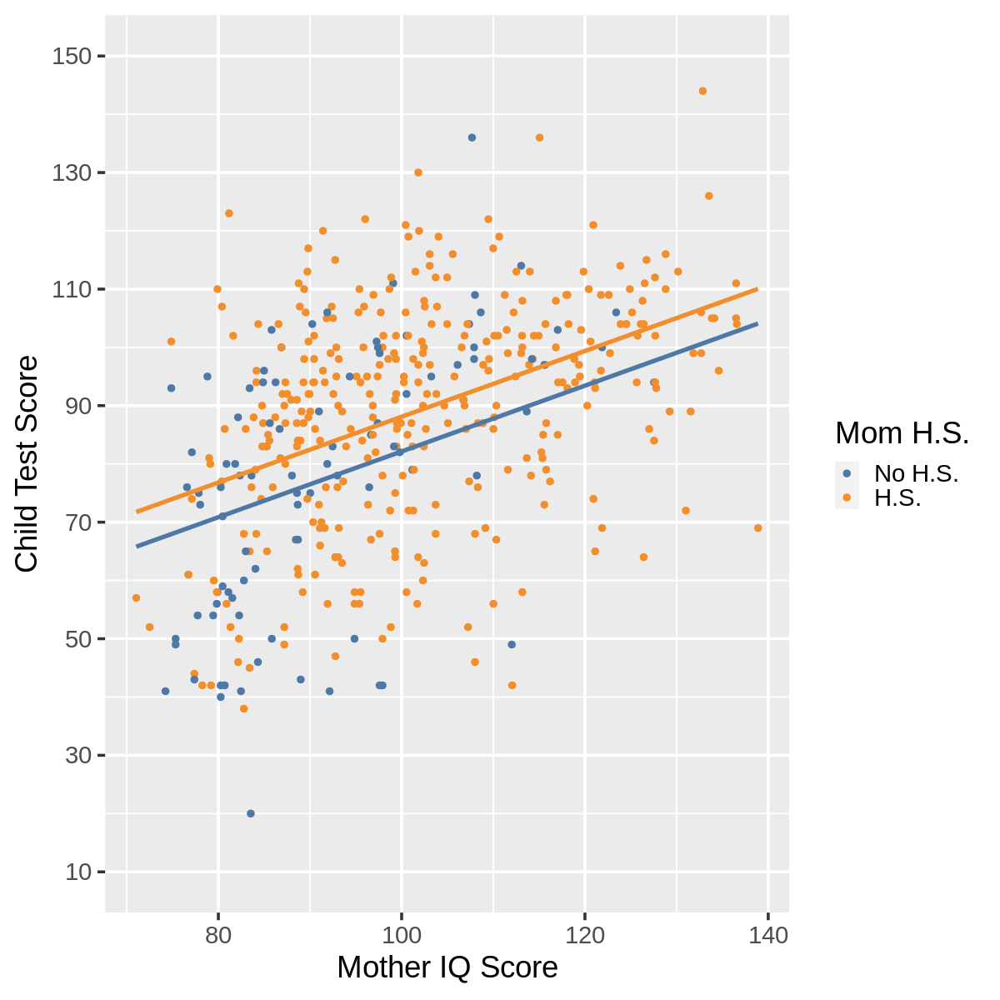

In [ ]:
options(repr.plot.width = 10, repr.plot.height = 10)

reg0 <- function(x, ests) cbind(1, 0, x) %*% ests
reg1 <- function(x, ests) cbind(1, 1, x) %*% ests
args <- list(ests = coef(m4))

ggplot(kidiq, aes(y = kid_score, x = mom_iq, colour = factor(mom_hs))) +
    geom_point(size = 2) +
    stat_function(fun = reg0, args = args, color = "#4E79A7", size = 1.5) +
    stat_function(fun = reg1, args = args, color = "#F28E2B", size = 1.5) +
    scale_color_manual(values = c("#4E79A7", "#F28E2B"),
                       labels = c("No H.S.", "H.S."),
                       name = "Mom H.S.") +
    scale_y_continuous(limits = c(10, 150),
                       breaks = seq(10, 150, 20)) +
    labs(x = 'Mother IQ Score',
         y = 'Child Test Score') +
    theme_grey(base_size = 22) +
    theme(plot.title = element_text(hjust = 0.5),
          legend.position = "right")

---

# Compare models

In [ ]:
comp <- loo_compare(loo1, loo2, loo3, loo4)
print(comp, simplify = FALSE, digits = 2)

   elpd_diff se_diff  elpd_loo se_elpd_loo p_loo    se_p_loo looic    se_looic
m4     0.00      0.00 -1876.01    14.22        3.97     0.36  3752.02    28.45
m3    -2.64      2.83 -1878.65    14.52        2.98     0.29  3757.30    29.05
m2   -38.87      8.34 -1914.88    13.81        3.14     0.30  3829.76    27.63
m1   -50.25      9.41 -1926.26    14.16        1.92     0.20  3852.52    28.33


In [ ]:
print(comp, simplify = TRUE, digits = 1)

   elpd_diff se_diff
m4   0.0       0.0  
m3  -2.6       2.8  
m2 -38.9       8.3  
m1 -50.3       9.4  


---

# Exercise:

### Estimate the relationship between `weight` and `height` in a sample of adults [[Source]](https://bookdown.org/content/4857/geocentric-models.html#linear-prediction)

### Read dataset into DataFrame

In [13]:
d <- read.csv("https://raw.githubusercontent.com/cbrownley/2025ODSCWest/main/data/Howell1.csv", sep=";")

### Filter for adults

In [15]:
d2 <- d %>% dplyr::filter(age >= 18)
glimpse(d2)

Rows: 352
Columns: 4
$ height <dbl> 151.7650, 139.7000, 136.5250, 156.8450, 145.4150, 163.8300, 149…
$ weight <dbl> 47.82561, 36.48581, 31.86484, 53.04191, 41.27687, 62.99259, 38.…
$ age    <dbl> 63.0, 63.0, 65.0, 41.0, 51.0, 35.0, 32.0, 27.0, 19.0, 54.0, 47.…
$ male   <int> 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1, …


### Plot data

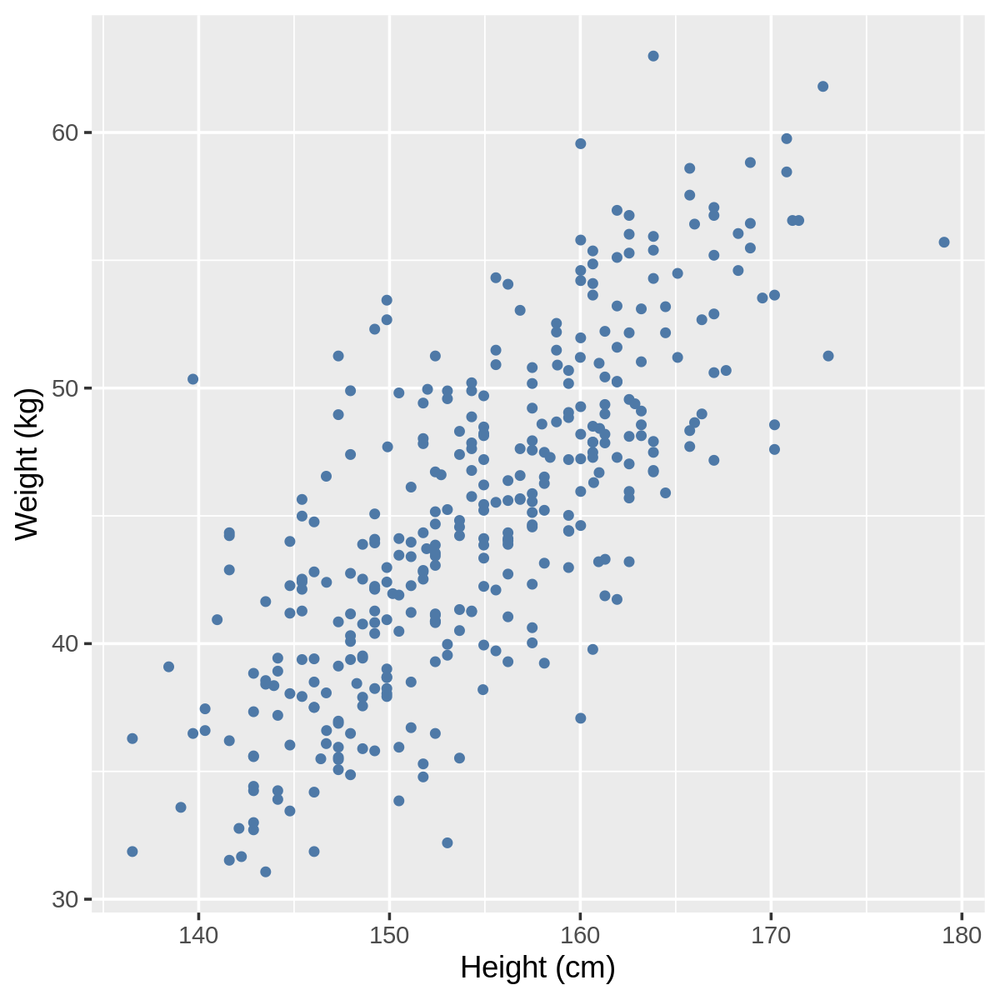

In [16]:
options(repr.plot.width = 10, repr.plot.height = 10)

ggplot(d2, aes(x = height, y = weight)) +
  geom_point(size = 3, colour = "#4E79A7") +
  labs(x = 'Height (cm)',
       y = 'Weight (kg)') +
  theme_grey(base_size = 22) +
  theme(plot.title = element_text(hjust = 0.5))

### Plot model

In [17]:
m_weight <- stan_glm(weight ~ 1 + height, data = d2,
                     family = gaussian(link = "identity"),
                     seed = 12345,
                     refresh = 0)

m_weight

stan_glm
 family:       gaussian [identity]
 formula:      weight ~ 1 + height
 observations: 352
 predictors:   2
------
            Median MAD_SD
(Intercept) -52.5    4.4 
height        0.6    0.0 

Auxiliary parameter(s):
      Median MAD_SD
sigma 4.2    0.2   

------
* For help interpreting the printed output see ?print.stanreg
* For info on the priors used see ?prior_summary.stanreg

In [18]:
summary(m_weight)


Model Info:
 function:     stan_glm
 family:       gaussian [identity]
 formula:      weight ~ 1 + height
 algorithm:    sampling
 sample:       4000 (posterior sample size)
 priors:       see help('prior_summary')
 observations: 352
 predictors:   2

Estimates:
              mean   sd    10%   50%   90%
(Intercept) -52.4    4.5 -58.1 -52.5 -46.7
height        0.6    0.0   0.6   0.6   0.7
sigma         4.3    0.2   4.1   4.2   4.5

Fit Diagnostics:
           mean   sd   10%   50%   90%
mean_PPD 45.0    0.3 44.6  45.0  45.4 

The mean_ppd is the sample average posterior predictive distribution of the outcome variable (for details see help('summary.stanreg')).

MCMC diagnostics
              mcse Rhat n_eff
(Intercept)   0.1  1.0  4256 
height        0.0  1.0  4240 
sigma         0.0  1.0  4033 
mean_PPD      0.0  1.0  4052 
log-posterior 0.0  1.0  1767 

For each parameter, mcse is Monte Carlo standard error, n_eff is a crude measure of effective sample size, and Rhat is the potential

### Plot prior parameter distributions

In [19]:
prior_summary(m_weight)

Priors for model 'm_weight' 
------
Intercept (after predictors centered)
  Specified prior:
    ~ normal(location = 45, scale = 2.5)
  Adjusted prior:
    ~ normal(location = 45, scale = 16)

Coefficients
  Specified prior:
    ~ normal(location = 0, scale = 2.5)
  Adjusted prior:
    ~ normal(location = 0, scale = 2.1)

Auxiliary (sigma)
  Specified prior:
    ~ exponential(rate = 1)
  Adjusted prior:
    ~ exponential(rate = 0.15)
------
See help('prior_summary.stanreg') for more details

### Fit model

In [20]:
m_weight <- stan_glm(weight ~ 1 + height, data = d2,
                     family = gaussian(link = "identity"),
                     seed = 12345,
                     refresh = 0)

m_weight

stan_glm
 family:       gaussian [identity]
 formula:      weight ~ 1 + height
 observations: 352
 predictors:   2
------
            Median MAD_SD
(Intercept) -52.5    4.4 
height        0.6    0.0 

Auxiliary parameter(s):
      Median MAD_SD
sigma 4.2    0.2   

------
* For help interpreting the printed output see ?print.stanreg
* For info on the priors used see ?prior_summary.stanreg

### Plot MCMC diagnostics

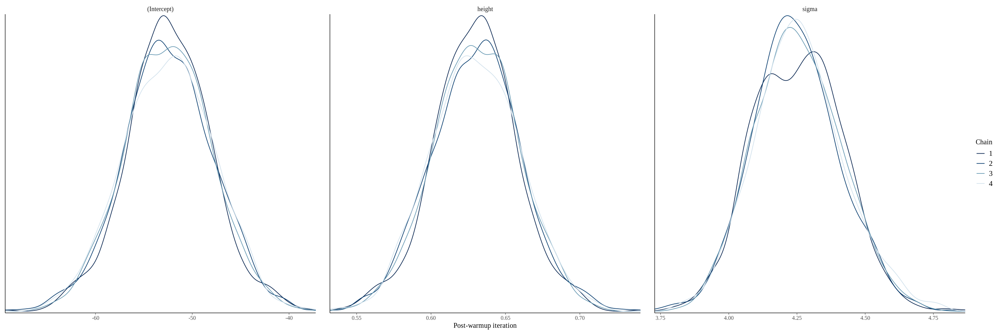

In [21]:
options(repr.plot.width = 24, repr.plot.height = 8)
mcmc_dens_overlay(m_weight) +
  xlab("Post-warmup iteration")

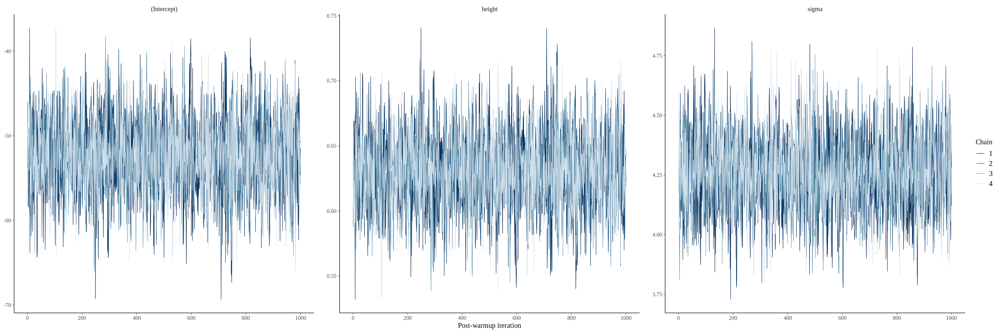

In [22]:
options(repr.plot.width = 24, repr.plot.height = 8)
mcmc_trace(m_weight) +
  xlab("Post-warmup iteration")

### Plot posterior distributions

In [23]:
m_weight_post <- as.matrix(m_weight)
dim(m_weight_post)

[1] 4000    3

In [24]:
dimnames(m_weight_post)

$iterations
NULL

$parameters
[1] "(Intercept)" "height"      "sigma"

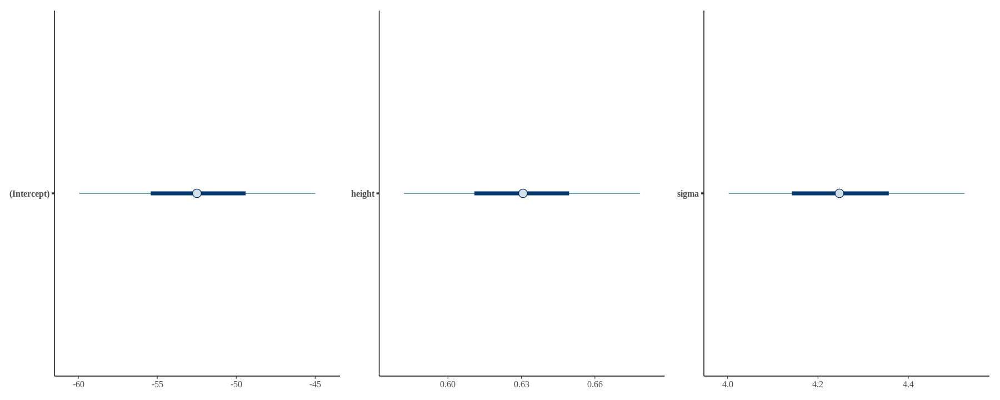

In [25]:
options(repr.plot.width = 15, repr.plot.height = 6)
g1 <- mcmc_intervals(m_weight_post, pars = c("(Intercept)"))
g2 <- mcmc_intervals(m_weight_post, pars = c("height"))
g3 <- mcmc_intervals(m_weight_post, pars = c("sigma"))
g1 + g2 + g3

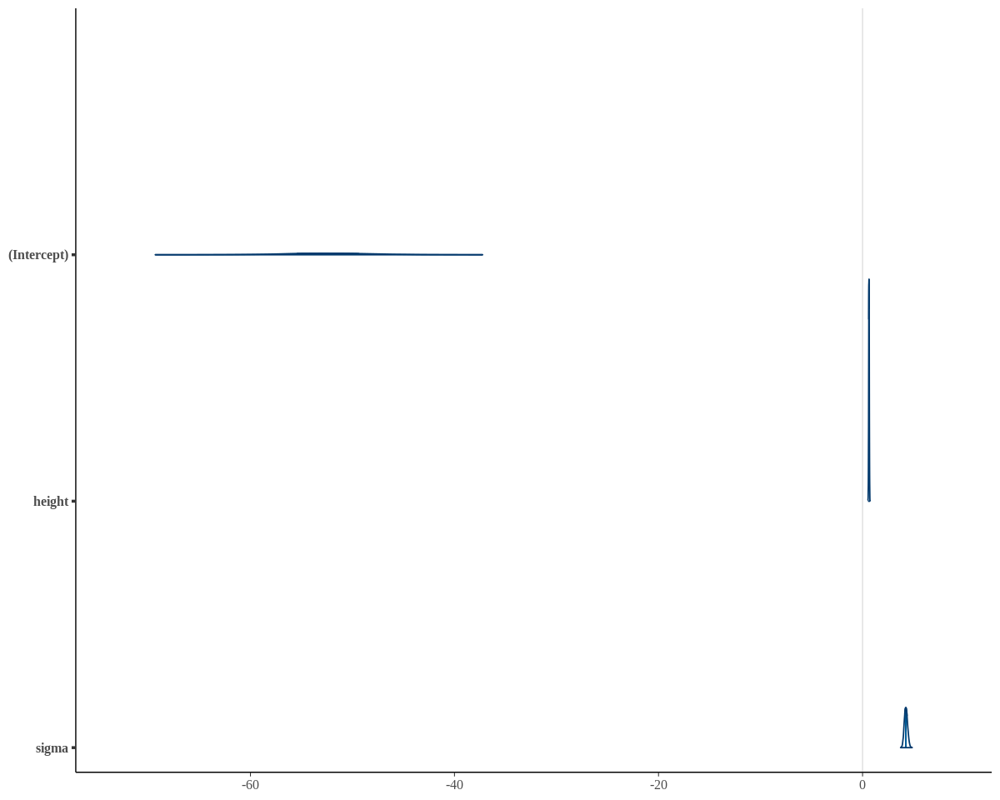

In [26]:
options(repr.plot.width = 10, repr.plot.height = 8)
mcmc_areas(m_weight_post)

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


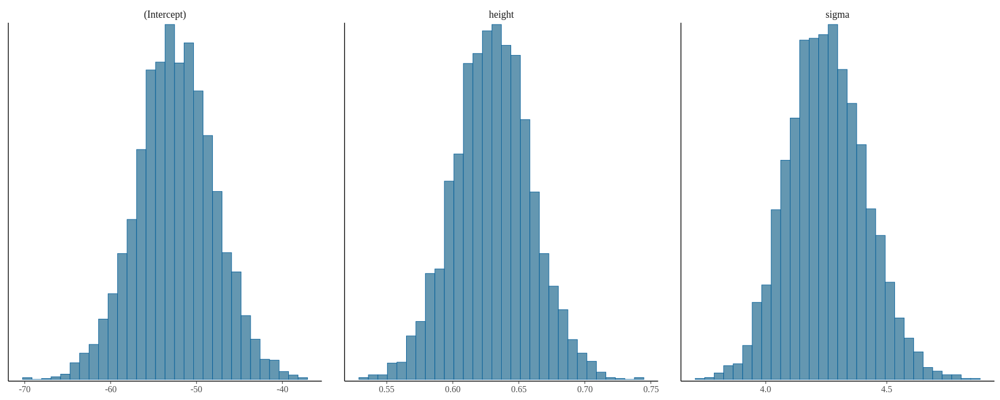

In [27]:
options(repr.plot.width = 15, repr.plot.height = 6)
mcmc_hist(m_weight_post)

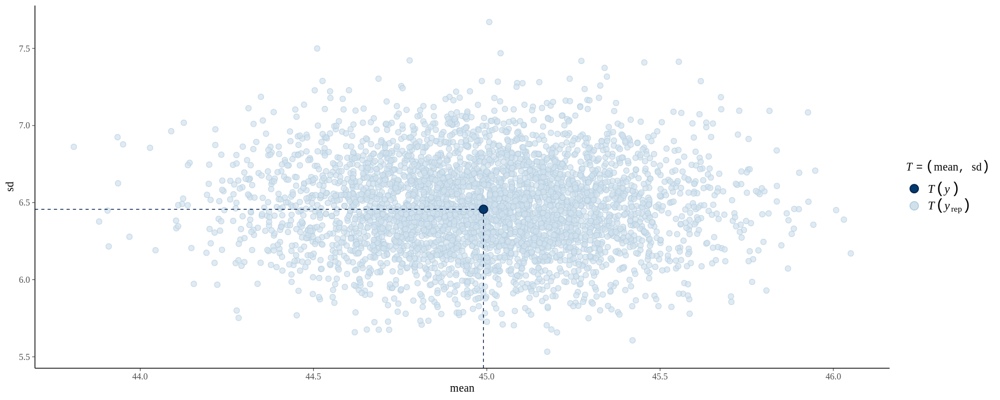

In [28]:
pp_check(m_weight, plotfun = "stat_2d", stat = c("mean", "sd"))

### Interpret results

In [29]:
print(m_weight)

stan_glm
 family:       gaussian [identity]
 formula:      weight ~ 1 + height
 observations: 352
 predictors:   2
------
            Median MAD_SD
(Intercept) -52.5    4.4 
height        0.6    0.0 

Auxiliary parameter(s):
      Median MAD_SD
sigma 4.2    0.2   

------
* For help interpreting the printed output see ?print.stanreg
* For info on the priors used see ?prior_summary.stanreg


In [30]:
summary(m_weight)


Model Info:
 function:     stan_glm
 family:       gaussian [identity]
 formula:      weight ~ 1 + height
 algorithm:    sampling
 sample:       4000 (posterior sample size)
 priors:       see help('prior_summary')
 observations: 352
 predictors:   2

Estimates:
              mean   sd    10%   50%   90%
(Intercept) -52.4    4.5 -58.1 -52.5 -46.7
height        0.6    0.0   0.6   0.6   0.7
sigma         4.3    0.2   4.1   4.2   4.5

Fit Diagnostics:
           mean   sd   10%   50%   90%
mean_PPD 45.0    0.3 44.6  45.0  45.4 

The mean_ppd is the sample average posterior predictive distribution of the outcome variable (for details see help('summary.stanreg')).

MCMC diagnostics
              mcse Rhat n_eff
(Intercept)   0.1  1.0  4256 
height        0.0  1.0  4240 
sigma         0.0  1.0  4033 
mean_PPD      0.0  1.0  4052 
log-posterior 0.0  1.0  1767 

For each parameter, mcse is Monte Carlo standard error, n_eff is a crude measure of effective sample size, and Rhat is the potential

### Plot posterior predictive distributions

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


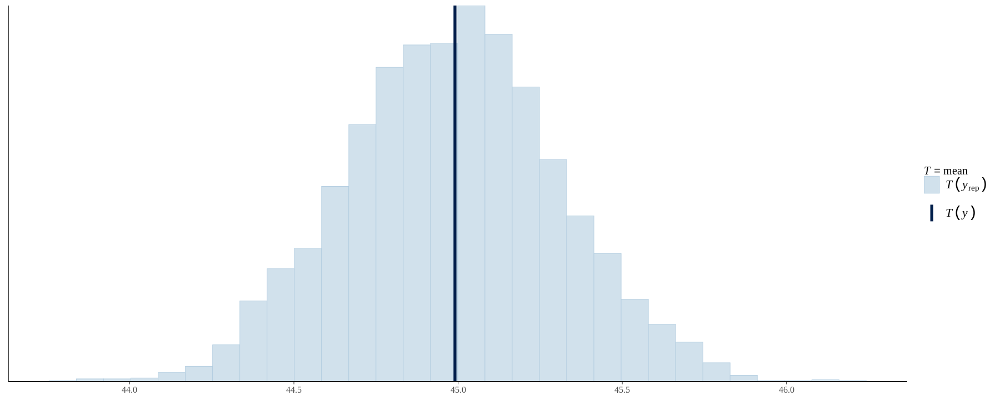

In [31]:
pp_check(m_weight, plotfun = "stat", stat = "mean")

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


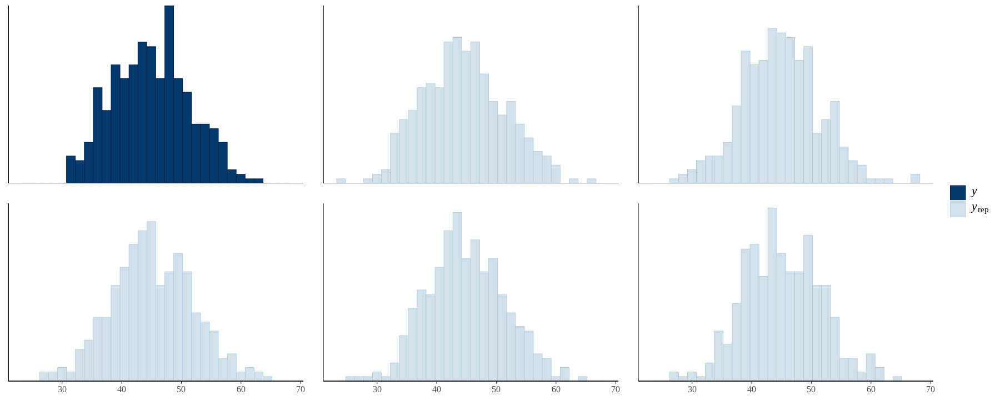

In [32]:
pp_check(m_weight, plotfun = "hist", nreps = 5)

In [33]:
y <- d2$weight

In [34]:
yrep_m <- posterior_predict(m_weight, draws = 500)
dim(yrep_m)

[1] 500 352

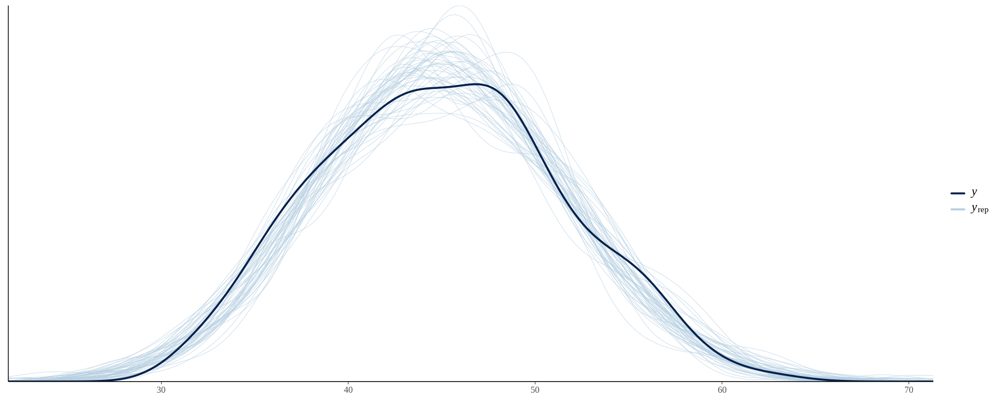

In [35]:
ppc_dens_overlay(y, yrep_m[1:50, ])

### Compute loo

In [36]:
m_weight_loo = loo(m_weight)
m_weight_loo


Computed from 4000 by 352 log-likelihood matrix

         Estimate   SE
elpd_loo  -1010.2 14.0
p_loo         3.1  0.4
looic      2020.3 28.0
------
Monte Carlo SE of elpd_loo is 0.0.

All Pareto k estimates are good (k < 0.5).
See help('pareto-k-diagnostic') for details.

---